##Notebok structure:


#Mini Project 2: Where Will Dicty Meet?

- Author: Dasha Lykova
- Affiliation: Columbia University
- Dataset: Dictyostelium discoideum aggregation movies (mixin44, mixin57, mixin64)
- GitHub (public): https://github.com/daria-ly/ML-for-Slime---Where-Will-Dicty-Meet-.git
- Colab (runnable): https://colab.research.google.com/drive/1VbgP5fwj0zHrJArdeDGIQx5jbemUbecU?usp=sharing

##Approach:

In this project, we investigate whether it is possible to predict where Dictyostelium discoideum (Dicty) will eventually aggregate using only the early frames of each time-lapse movie. Since the data does not include explicit annotations of aggregation centers, we estimate ground truth by averaging the final frames of each movie and computing the center of mass of the resulting intensity field. The key question of the project is how much information about the final aggregation place is already embedded in the first few frames, and how different modeling approaches use these early cues.

To address this, we train several models to predict the future aggregation center. Three of the models directly regress an (x, y) coordinate. The fourth model outputs a spatial probability heatmap whose argmax is taken as the predicted center and whose shape provides additional interpretability. We evaluate all models on accuracy, reproducibility across seeds, and robustness to downsampling, and we examine how accuracy changes with the number of available early frames.

# Part A — Next-Frame Prediction (Conv2D + LSTM) - working through professor code
### A1. Imports & reproducibility
###A2. Data loading and Z-projection
###A3. Windowed dataset creation
###A4. Modelling
###A5. Varying the model
###A6. Extensions

# Part B — Aggregation-Center Prediction - courseworks assignmet fullfillment
###B1. Data loading & preprocessing
###B2. Sliding-window datasets (train/test)
###B3. Coordinate regression models
###B4. Heatmap model
###B5. Comparison table & predictions vs truth


#Part A

### A1. Imports & reproducibility

In [1]:
#@title Setup
!pip -q install tifffile h5py scikit-image tqdm
!pip install zarr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.1/284.1 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 50.8 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#@title Imports & seed
import os, random, numpy as np, matplotlib.pyplot as plt, torch
from torch import nn
from torch.utils.data import Dataset, DataLoader, random_split
import zarr

try:
    import tifffile as tiff
except Exception:
    tiff = None
try:
    import h5py
except Exception:
    h5py = None

#set seed to get reproducable results
def set_seed(seed=7):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic=True; torch.backends.cudnn.benchmark=False
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
set_seed(7); DEVICE

'cuda'

In [4]:
def set_global_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    # full deterministic behavior
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_global_seed(7)

In [5]:
#unzip the zip file provided in shared Google Drive
#I picked mixin57 because it is the most practical and usable dataset out of the three (according to the provided csv file).
#mixin44 only has 34 subsampled frames and 32 Z-slices, which makes it heavier and less consistent
#for sliding-window modeling. mixin64 is even less ideal: it has only 20 subsampled frames and a very
#large 48-slice Z-stack that is later downsampled 4×, which introduces artifacts. mixin57
#provides 40 evenly subsampled frames (the largest useful sequence), a clean 16-slice Z-stack, and the
#same 256×256 spatial resolution as the others. This makes mixin57 the most balanced option overall:
#it has enough frames to actually learn something over time, it loads quickly without being too heavy,
#and the aggregation patterns are clear and easy to work with.

!unzip "/content/drive/MyDrive/slime/mixin_test57.zip" -d "/content/drive/MyDrive/slime/"

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/slime/mixin_test57/2024-02-29_mixin57_overnight_25um_ERH_Red_FarRed_25.zarr/363.0.9.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_test57/2024-02-29_mixin57_overnight_25um_ERH_Red_FarRed_25.zarr/302.0.12.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_test57/2024-02-29_mixin57_overnight_25um_ERH_Red_FarRed_25.zarr/336.0.3.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_test57/2024-02-29_mixin57_overnight_25um_ERH_Red_FarRed_25.zarr/339.0.0.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_test57/2024-02-29_mixin57_overnight_25um_ERH_Red_FarRed_25.zarr/338.0.13.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_test57/2024-02-29_mixin57_overnight_25um_ERH_Red_FarRed_25.zarr/337.0.4.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_test57/2024-02-29_mixin57_overnight_25um_ERH_Red_FarRed_25.zarr/272.0.13.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_test57/2024-02-2

###Methods:
Data descriptionWe analyze three experimental movies stored in Zarr format: mixin44, mixin57, and mixin64. Each movie is a curated “Dicty disco show” of cropped fields of view that capture different stages of aggregation and streaming as Dictyostelium cells move around. The data consist of time-lapse stacks with T timepoints (20–40 depending on the movie), one fluorescence channel, 16 z-slices, and a spatial resolution of 256×256 pixels. These stacks show cells as they begin to self-organize and migrate, so the pixel-level changes across frames can in principle be used to estimate local motion and vector flow fields. No masks, labels, or manual annotations are provided; all supervision derives from computing the aggregation center directly from the final frames.

###A2. Data loading and Z-projection

## 1) Load data (choose a reader and set `DATA_PATH`)

In [6]:
#@title Readers
#use subsampled mixin57: highest time resolution (1 min), largest movie (400 --> 40 frames),
#and fewer z-slices (16) for clean projection, making it the best dataset for temporal modeling
DATA_PATH= "/content/drive/MyDrive/slime/mixin_test57/2024-02-29_mixin57_overnight_25um_ERH_Red_FarRed_25_t_subsampled.zarr"

#-------------------------------------------------------------------------------------------------------------------------
#functions not useful for given data formats commented out
#-------------------------------------------------------------------------------------------------------------------------
#def read_npy(path): return np.load(path)

#def read_h5(path, key="images"):
    #assert h5py is not None, "install h5py"
    #import h5py as _h5
    #with _h5.File(path, "r") as f: arr= f[key][:]
    #return np.array(arr)

#def read_tiff_stack(path):
    #assert tiff is not None, "install tifffile"
    #return np.asarray(tiff.imread(path))
#-------------------------------------------------------------------------------------------------------------------------


#add a reader for zarr files (since we are provided zarr files in the Google Drive)
def read_zarr(path):
    z= zarr.open(path, mode="r")
    arr = np.array(z)
    arr= arr.astype(np.float32)
    print("Loaded Zarr array shape:", arr.shape, "dtype:", arr.dtype)
    return arr

#load the zarr movie using read_zarr(), then convert the numpy array into a PyTorch tensor
def load_dicty_tensor(path):
    arr= read_zarr(path)
    tensor= torch.from_numpy(arr)
    return tensor

#-------------------------------------------------------------------------------------------------------------------------
#commented out because unsuitable for .zarr file format
#raw = read_npy(DATA_PATH)
#raw = read_h5(DATA_PATH, key="images")
#raw = read_tiff_stack(DATA_PATH)
#-------------------------------------------------------------------------------------------------------------------------

#read the zarr file
raw = load_dicty_tensor(DATA_PATH)

#check tensor shape and data type to be sure of our choice of mixin57 +
#sanity check
print("Tensor shape:", raw.shape)
print("Tensor dtype:", raw.dtype)

Loaded Zarr array shape: (40, 1, 16, 256, 256) dtype: float32
Tensor shape: torch.Size([40, 1, 16, 256, 256])
Tensor dtype: torch.float32


####Notice that professor starter code expects (T,1,H,W), but the provided zarr is (T,1,Z,H,W). In order to reconcline this we will project over Z to convert the 3D z-stack at each timepoint into a 2D frame.

In [7]:
#@title Simple PyTorch Data Loader (for Dicty)

#the raw zarr movie includes a full z-stack for every timepoint, but Dicty essentially crawls along the surface of the agar.
#Most of the meaningful visual structure lives in the x–y plane, while the extra 16 slices mainly capture slightly shifted focal planes
#rather than real 3D behavior. Taking a max projection across z gives us a clean 2D frame that still preserves the relevant
#spatial patterns. It also brings the data into the exact (T,1,H,W)
#format  the prof’s starter code expects, so the rest of the pipeline
#(WindowedFrames, TinyCNN, etc.) works as intended.

raw_2d= raw.max(dim=2).values #reduce z dimension and extract the resulting tensor
print("2D movie shape:", raw_2d.shape)

2D movie shape: torch.Size([40, 1, 256, 256])


In [8]:
raw_np = raw_2d.cpu().numpy().astype(np.float32) #convert to NumPy to use prof's WindowedFrames

In [9]:
raw_np.shape #sanity check

(40, 1, 256, 256)

###A3. Windowed dataset creation

In [10]:
#@title Dataset & loaders

from torch.utils.data import Dataset, DataLoader, random_split

class WindowedFrames(Dataset):
    def __init__(self, arr, K):
        #if data comes without channel dimension, add it
        if arr.ndim==3:
            arr = arr[:,None,...]
        self.arr = arr.astype(np.float32)
        self.K = K

    def __len__(self):
        #number of available input windows
        return self.arr.shape[0]-self.K

    def __getitem__(self,i):
        #input window
        x = torch.from_numpy(self.arr[i:i+self.K])
        #target frame
        y = torch.from_numpy(self.arr[i+self.K])
        return x,y


#window length
K=4

#dataset
ds=WindowedFrames(raw_np,K)

#70/15/15 split
n_tr=int(0.7*len(ds))
n_val=int(0.15*len(ds))
n_te=len(ds)-n_tr-n_val

#reproducibility
gen=torch.Generator().manual_seed(0)

#splits
tr,val,te=random_split(ds,[n_tr,n_val,n_te],generator=gen)

#loaders
tr_loader=DataLoader(tr,batch_size=16,shuffle=True)
val_loader=DataLoader(val,batch_size=32)
te_loader=DataLoader(te,batch_size=32)

len(tr),len(val),len(te)

(25, 5, 6)

In [11]:
#class DictyDataset(Dataset):
    #def __init__(self, movie_tensor, window=4):
        #assert movie_tensor.dim() == 4 #Use the last 4 frames to predict the next one
        #self.movie = movie_tensor #full 2D movie
        #self.window = window #number of past frames to use
        #self.length = movie_tensor.shape[0] - window #number of sliding window samples

    #def __len__(self):
        #return self.length #number of training examples

    #def __getitem__(self, idx):
        #X = self.movie[idx : idx + self.window]  #(window, 1, H, W) - past frames
        #y = self.movie[idx + self.window]  # (1, H, W) - next frame to predict

        #return X, y

#create the dataset and loader
#window= 4
#dataset= DictyDataset(raw_2d, window=window)
#loader= DataLoader(dataset, batch_size=4, shuffle=True)

#inspect one sample ([0])
#X0, y0= dataset[0]
#print("Sample X shape:", X0.shape) #4 past frames
#print("Sample y shape:", y0.shape) #next frame

I would like to check if collapsing into 2D causes important data to be lost, so I am going to output all the frames (all z_s and all t_s)

In [12]:
import numpy as np
import matplotlib.pyplot as plt

#make a mosaic of selected timepoints and slices
def make_full_mosaic_with_labels(arr, t_list, z_list=None, savepath="mosaic.png"):
    T, C, Z, H, W = arr.shape

    #default slices if none provided
    if z_list is None:
        z_list = list(range(Z))

    n_rows = len(t_list)
    n_cols = len(z_list)

    #figure layout
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(n_cols*1.3, n_rows*1.3),
        squeeze=False
    )

    for i, t in enumerate(t_list):
        for j, z in enumerate(z_list):
            ax = axes[i, j]
            img = arr[t, 0, z].cpu().numpy()

            ax.imshow(img, cmap="gray")
            ax.axis("off")

            #column labels
            if i == 0:
                ax.set_title(f"z = {z}", fontsize=9)

            #row labels
            if j == 0:
                ax.text(
                    -0.3, 0.5,
                    f"t = {t+1}",
                    fontsize=9,
                    va="center",
                    ha="right",
                    rotation=90,
                    transform=ax.transAxes
                )

    plt.tight_layout()
    plt.savefig(savepath, dpi=200, bbox_inches="tight")
    plt.show()

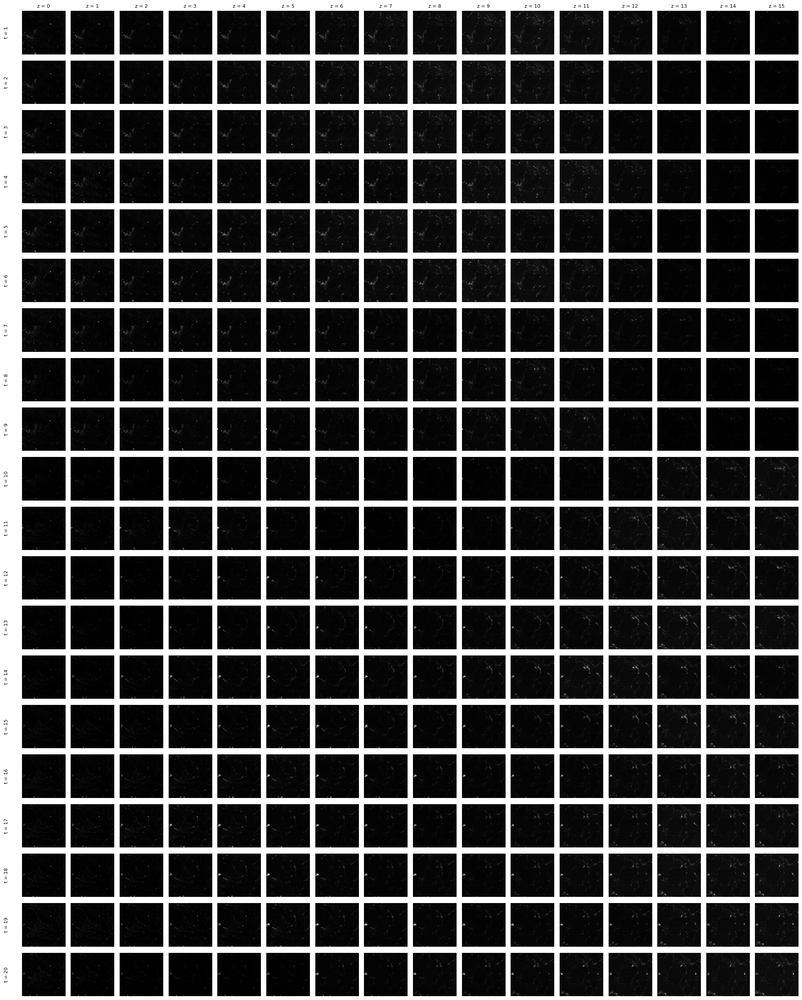

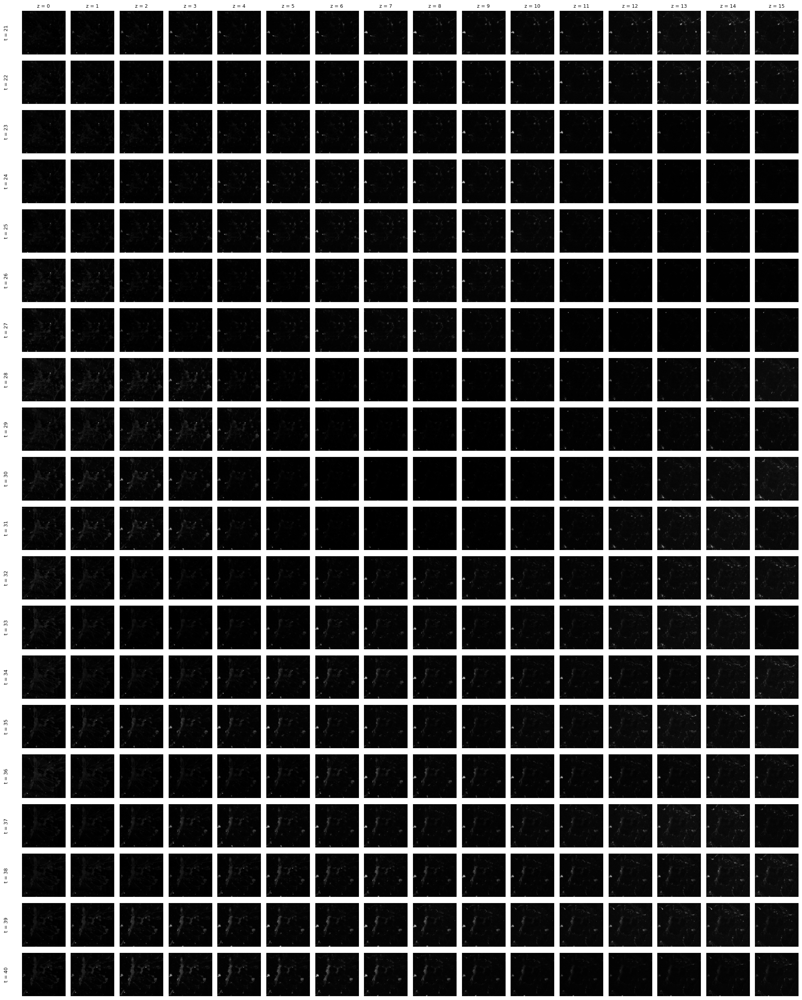

In [13]:
#Split to not overflow RAM - mosaic of frames

#mosaic 1: timepoints 0–19 (t = 1–20 in labels)
make_full_mosaic_with_labels(
    raw,
    t_list=list(range(0, 20)),
    savepath="dicty_mosaic_t1_to_t20.png"
)

#mosaic 2: timepoints 20–39 (t = 21–40 in labels)
make_full_mosaic_with_labels(
    raw,
    t_list=list(range(20, 40)),
    savepath="dicty_mosaic_t21_to_t40.png"
)


After I have inspected all 16 slices across time (see the mosaic figures above), I see the same Dicty patterns showing up in every slice — the differences are mostly just slight changes in focus or brightness. Hence we can conclusde that the real structure we care about lives in the x–y plane and doesn’t change meaningfully through the z-axis, a simple max projection gives a clean 2D movie without losing important information. It also puts the data into the (T,1,H,W) format that the starter code expects, so everything downstream works smoothly.

shape: torch.Size([40, 1, 16, 256, 256]) min/max: 286.0 63530.0


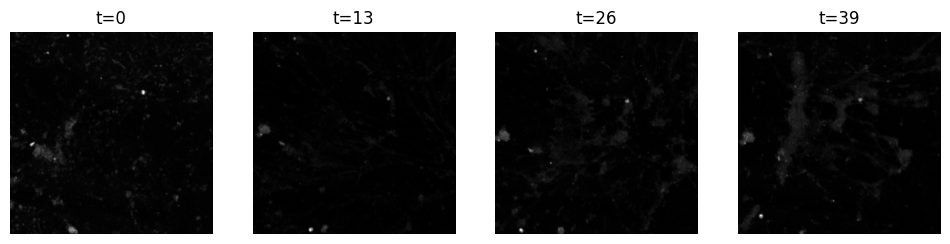

In [14]:
#@title Inspect & visualize a few frames
print("shape:", raw.shape, "min/max:", float(raw.min()), float(raw.max()))
T = raw_np.shape[0] #for spacing out indeces propely
def show_frames(arr, frames=(0, T//3, 2*T//3, T-1)):
    import matplotlib.pyplot as plt
    fig,axs = plt.subplots(1,len(frames), figsize=(12,3))
    for ax,t in zip(axs,frames):
        ax.imshow(arr[t] if arr.ndim==3 else arr[t,0], cmap="gray"); ax.set_title(f"t={t}"); ax.axis("off")
    plt.show()
show_frames(raw_np)

Throughout the different time points we have chosen, Dicty cells demonstrate how they develop from random individual motion to coordinated collective aggregation. In the first time frame (t = 0), the fluorescence signal is dispersed, and the cells appear random and scattered without any compelling spatial pattern. During the time frames with t = 13-26, faint filament-like associations emerge as individual cells respond to localized cAMP signaling waves, and subtle alignment in cell motion is observed. A later time frames (t = 26–39) reveal clear radial streams that resemble elongated regions of increased fluorescence intensity where cells are migrating towards a central point of aggregation. Overall, the later time points depict cells undergoing a transition into chemotactic streaming where cells no longer drift randomly, but rather form a more pronounced directionally-towed path of cells, with each path pointed to the same unique origin or space. The motion becomes more coordinated, and we can see the population gradually pulling itself together into a tighter cluster. This shift from scattered, independent movement to organized, collective flow is what we expect during the early stages of Dicty aggregation.

In [15]:
#@title Visualize a few time frames (processed data (tensor))
#import matplotlib.pyplot as plt

#T = raw_2d.shape[0]
#select ts to plot: by quartiles
#time_indices= [0,T//4, T//2,3*T//4, T-1]

#figure parameters
#fig, axes= plt.subplots(1, len(time_indices), figsize=(17, 3))

#gather all frames for colorbar scaling
#all_frames= []

#loop over selected timepoints and plot each frame in a separate subplot
#for ax, t in zip(axes, time_indices):
    #frame = raw_2d[t, 0].cpu().numpy()
    #im= ax.imshow(frame, cmap="gray")
    #ax.set_title(f"t = {t}")
    #ax.axis("off")
    #all_frames.append(frame)

#create a single colorbar below all images
# (to show mapping between pixel intensity values and grayscale color)
#fig.subplots_adjust(bottom=0.15)  #space for colorbar
#cbar_ax = fig.add_axes([0.1,0.05, 0.8,0.03])
#fig.colorbar(im, cax=cbar_ax, orientation="horizontal")

#plt.show()

##Inspect the data tensor

In [16]:
print(raw.shape)
print(raw_2d.shape)

torch.Size([40, 1, 16, 256, 256])
torch.Size([40, 1, 256, 256])


Prior to Z-projection, zarr is loaded as a 5D tensor, with a shape of (40, 1, 16, 256, 256). The first dimension (40) is the time axis - the dataset contains 40 frames recorded over the course of the experiment. The second dimension (1) shows that the movie was captured using a single fluorescence channel. The third dimension (16) is the number of z-slices collected at each timepoint, meaning that every frame is actually a small stack of 16 images taken at different focal depths. Finally, the last two dimensions (256 × 256) are simply the height and width of each image, giving the spatial resolution of the field of view.

Because Dicty aggregation occurs in the two-dimensional XY plane, there is redundant depth information in the z-stack for the purpose of modeling (we have already confirmed it by investigating all the frames) . We then apply a max-projection over the z-dimension which collapses each stack of 16 slices into a single 2D image. Therefore the data becomes a 4D tensor, with a shape of (40, 1, 256, 256), and is now a clean 2D time-lapse movie, ready for further development and analysis.

###A4. Modelling

##Define the learning setup

This problem makes the most sense as a supervised, more specifically, self-supervised, learning task. Even though the dataset doesn’t come with labels, the movie itself gives us a natural way to create them: we can use a short sequence of earlier frames as the input and the following frame as the prediction target. For instance, frames t, t+1, t+2, and t+3 can be used to predict frame t+4. Framing the task this way turns it into a nonlinear regression problem where the model learns how the pattern of Dicty cells changes over time.

To approach this, we use a convolutional neural network that takes a window of past frames and tries to predict the next one. This works well because Dicty aggregation doesn’t happen all at once: cells gradually start responding to chemical signals, forming density patterns and early organized cell trajectories that point toward where the group of cells will eventually appear. These early spatial cues show up clearly in the images, so a CNN can learn them and use that information to forecast what the next frame should look like. Once trained, the model effectively learns the movement patterns and can be used to anticipate where the aggregation nucleus will form, even from early frames. I think next-frame prediction is the best because it is straightforward, interpretable, and well-matched to the biological process we’re trying to model.

##Specify the optimization target

The model’s optimization target is to predict the next frame in the movie based on a short sequence of earlier frames. Let each frame at time $t$ be a continuous-valued fluorescence image $\mathbf{x}_t \in \mathbb{R}^{H \times W}$.

If we use a window of size $w$, then the model receives $\mathbf{X}_t = \left( \mathbf{x}_{t - w + 1}, \ldots, \mathbf{x}_t \right) \in \mathbb{R}^{w \times H \times W}$ as input, and it outputs a prediction $\hat{\mathbf{x}}_{t+1} = f_\theta(\mathbf{X}_t)$ for the next frame. The training objective is to minimize the difference between $\hat{\mathbf{x}}_{t+1}$ and the true next frame $\mathbf{x}_{t+1}$. Since the frames are real-valued pixel matrices, this becomes a straightforward pixel-wise regression problem.

To train the model, we minimize the mean squared error (MSE) loss: $L(\theta) = \frac{1}{N} \sum_{t \in \mathcal{I}_{\text{train}}} \left\| f_\theta(\mathbf{X}_t) - \mathbf{x}_{t+1} \right\|_F^2$, where $\|\cdot\|_F$ denotes the Frobenius norm (ie the sum of squared pixel differences). MSE works well here because it directly measures how far each predicted intensity is from the actual intensity, and the squared penalty encourages the model to pay attention to large deviations. In practice, this helps the network learn both broad movement patterns (e.g the direction in which cells start to stream) and subtle local shifts in brightness that reflect changes in cell density. While other loss functions could be used, MSE provides a stable, simple, and very common baseline for next-frame prediction tasks like this.

To split the data, we divide the 40-frame sequence into training and testing sets using an 80/20 chronological split. If the valid prediction indices are $\{1, 2, \ldots, 39\}$, then an 80\% training portion corresponds to 𝓘ₜᵣₐᵢₙ = {1, ..., 32}, 𝓘ₜₑₛₜ = {33, ..., 39}.


A random shuffle would mix early and late frames and effectively leak information from the future into the past, which would undermine the temporal forecasting nature of the task. By training only on the earlier part of the movie and evaluating on the later part, the model is asked to extrapolate forward in time — learning from the start of the aggregation process and then being tested on its ability to anticipate the more developed streaming patterns that come later.


In [17]:
#TinyCNN applies a 3D convolution over the full window
class TinyCNN(nn.Module):
    def __init__(self,K):
        super().__init__()
        self.enc = nn.Sequential(
            nn.Conv3d(1,8,kernel_size=(K,3,3),padding=(0,1,1)),
            nn.ReLU()
        )
        self.head = nn.Sequential(
            nn.Conv2d(8,16,3,padding=1),
            nn.ReLU(),
            nn.Conv2d(16,1,1)
        )

    def forward(self,x):
        x = x.permute(0,2,1,3,4)
        z = self.enc(x).squeeze(2)
        return self.head(z)

ep 01  tr 3734269.8800  val 3239092.2500
ep 02  tr 3628481.3100  val 3153896.2500
ep 03  tr 3534282.8600  val 3056421.5000
ep 04  tr 3419355.9800  val 2926135.7500
ep 05  tr 3267486.2400  val 2749467.7500
ep 06  tr 3054565.5600  val 2520118.0000
ep 07  tr 2788505.2500  val 2237958.7500
ep 08  tr 2467057.6500  val 1905775.6250
ep 09  tr 2087082.3350  val 1547007.5000
ep 10  tr 1688349.4050  val 1208843.2500
ep 11  tr 1327168.5050  val 961260.4375
ep 12  tr 1082403.9550  val 884431.1875
ep 13  tr 1035584.4775  val 975514.0000
ep 14  tr 1146702.2650  val 1066874.0000
ep 15  tr 1224597.1200  val 1048405.9375
ep 16  tr 1187776.6750  val 961403.1875
ep 17  tr 1087957.4750  val 878510.4375
ep 18  tr 1000579.2750  val 832657.1875
ep 19  tr 954034.4375  val 820780.8125
ep 20  tr 944705.0450  val 825858.7500
ep 21  tr 950728.8350  val 833470.0000
ep 22  tr 956401.3725  val 831665.4375
ep 23  tr 949803.5725  val 817622.4375
ep 24  tr 931650.3450  val 800395.1875
ep 25  tr 910280.8350  val 785821.

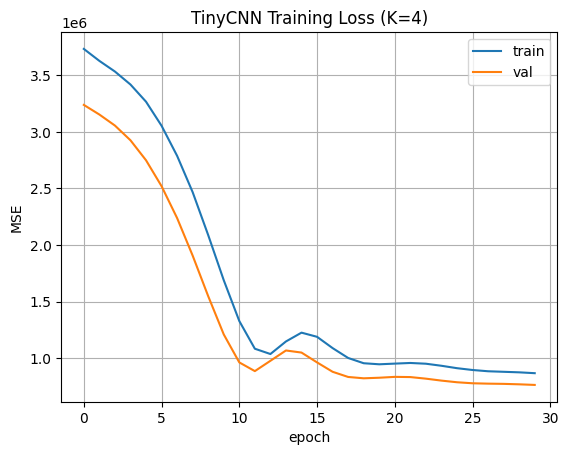

In [18]:
#@title First modeling attempt (K=4)

def set_seed(seed=7):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic=True
    torch.backends.cudnn.benchmark=False

set_seed(7)

K=4

#loss function
loss_fn=nn.MSELoss()

#dataset and loaders
ds=WindowedFrames(raw_np,K)
n_tr=int(0.7*len(ds))
n_val=int(0.15*len(ds))
n_te=len(ds)-n_tr-n_val
tr,val,te=random_split(ds,[n_tr,n_val,n_te],generator=torch.Generator().manual_seed(7))
tr_loader=DataLoader(tr,batch_size=16,shuffle=True)
val_loader=DataLoader(val,batch_size=32)

#model setup
model=TinyCNN(K).to(DEVICE)
opt=torch.optim.Adam(model.parameters(),lr=1e-3,weight_decay=1e-5)

#loss logs
hist_tr=[]
hist_val=[]


#@title First modeling attempt
class TinyCNN(nn.Module):
    def __init__(self,K):
        super().__init__()
        self.enc=nn.Sequential(
            nn.Conv3d(1,8,kernel_size=(K,3,3),padding=(0,1,1)),
            nn.ReLU()
        )
        self.head=nn.Sequential(
            nn.Conv2d(8,16,3,padding=1),
            nn.ReLU(),
            nn.Conv2d(16,1,1)
        )
    def forward(self,x):
        x=x.permute(0,2,1,3,4)
        z=self.enc(x).squeeze(2)
        return self.head(z)

def train_epoch(model,loader,optimizer=None,loss_fn=None):
    model.train()
    total=0.0
    opt_used=optimizer if optimizer is not None else opt
    loss_used=loss_fn if loss_fn is not None else globals()["loss_fn"]
    for xb,yb in loader:
        xb=xb.to(DEVICE)
        yb=yb.to(DEVICE)
        opt_used.zero_grad()
        pred=model(xb)
        loss=loss_used(pred,yb)
        loss.backward()
        opt_used.step()
        total+=loss.item()*xb.size(0)
    return total/len(loader.dataset)

@torch.no_grad()
def evaluate(model,loader):
    model.eval()
    total=0.0
    for xb,yb in loader:
        xb=xb.to(DEVICE)
        yb=yb.to(DEVICE)
        total+=loss_fn(model(xb),yb).item()*xb.size(0)
    return total/len(loader.dataset)

hist_tr=[]
hist_val=[]
for ep in range(1,31):
    tr_loss=train_epoch(model,tr_loader)
    va_loss=evaluate(model,val_loader)
    hist_tr.append(tr_loss)
    hist_val.append(va_loss)
    print(f"ep {ep:02d}  tr {tr_loss:.4f}  val {va_loss:.4f}")

plt.figure()
plt.plot(hist_tr,label="train")
plt.plot(hist_val,label="val")
plt.title(f"TinyCNN Training Loss (K={K})")
plt.legend()
plt.grid(True)
plt.xlabel("epoch")
plt.ylabel("MSE")
plt.show()

We see that both the training and validation losses decrease quickly during the first 10 epochs, showing that the model is learning important patterns from the input data early on. The steep drop indicates that the model is able to adjust its parameters effectively and reduce error fast. After this initial phase, the losses begin to flatten out, meaning the model is still improving but at a slower, more stable pace. Throughout training, the validation loss remains consistently close to the training loss, and even slightly lower in some epochs. This suggests the model is not overfitting and is generalizing well to unseen data. The validation performance is steady, which is a good sign that the model has learned meaningful, transferable patterns from the Dicty movie.
The graph hence confirms that the model is behaving as expected. It's picking up on the way cells move and align over time and is able to make useful predictions about the next frame based on recent history.

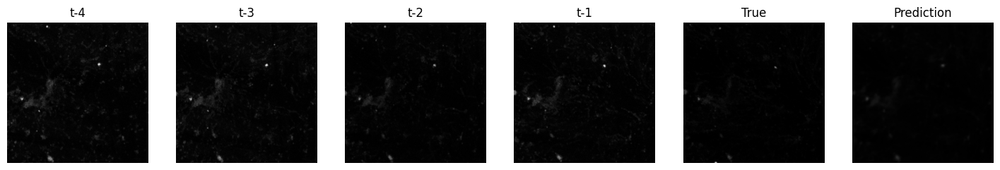

In [19]:
#@title Show one prediction (reuse trained K=4 model which was run above)

@torch.no_grad()
def show_example(i=0):
    #use the already trained model and existing dataset ds
    model.eval()

    #xb: (K,1,H,W), yb: (1,H,W)
    xb, yb = ds[i]
    pred = model(xb.unsqueeze(0).to(DEVICE)).cpu().squeeze().numpy()
    true = yb.squeeze().numpy()
    hist = xb[:, 0].numpy()

    cols = hist.shape[0] + 2
    fig, axs = plt.subplots(1, cols, figsize=(3 * cols, 3))

    #history frames
    for k in range(hist.shape[0]):
        axs[k].imshow(hist[k], cmap="gray")
        axs[k].set_title(f"t-{hist.shape[0]-k}")
        axs[k].axis("off")

    #true next frame
    axs[-2].imshow(true, cmap="gray")
    axs[-2].set_title("True")
    axs[-2].axis("off")

    #prediction, same intensity range as true frame
    axs[-1].imshow(pred, cmap="gray", vmin=true.min(), vmax=true.max())
    axs[-1].set_title("Prediction")
    axs[-1].axis("off")

    plt.show()

show_example(5)

The prediction actually looks pretty good overall. The model clearly picked up the important structure from the previous four frames, and the main bright spots line up with the true next frame. The prediction is a bit darker and smoother, but that makes sense for several reasons. TinyCNN is very small, with only a few filters, so it cannot capture the finer high-frequency details in these images. MSE also pushes the model toward averaging, which naturally introduces blur. On top of that, fluorescence movies are extremely noisy, so the network often removes grain that is actually part of the real signal. There is also no normalization layer, so the model learns raw intensity values and tends to play it safe with smoother outputs. Even with those limitations, it still captures the overall flow and spatial pattern well, which shows that it learned something meaningful about how the scene evolves.

###A5. Varying the model

ep 01  tr 3978542.5000  val 3622376.5000
ep 02  tr 3787121.5870  val 3385175.2500
ep 03  tr 3527082.6630  val 3036933.2500
ep 04  tr 3164630.8152  val 2595990.0000
ep 05  tr 2699268.3804  val 2098676.7500
ep 06  tr 2196681.7663  val 1592437.6250
ep 07  tr 1689656.7283  val 1167849.2500
ep 08  tr 1297592.3261  val 986324.8125
ep 09  tr 1169451.3750  val 1121676.5000
ep 10  tr 1335477.2228  val 1252468.0000
ep 11  tr 1423718.8750  val 1179862.3750
ep 12  tr 1326749.1196  val 1035724.0000
ep 13  tr 1188061.5870  val 944311.8125
ep 14  tr 1105419.4348  val 919670.0000
ep 15  tr 1081339.1576  val 927319.1875
ep 16  tr 1091636.1848  val 936404.6250
ep 17  tr 1099265.5924  val 931663.1250
ep 18  tr 1091569.5380  val 912669.1875
ep 19  tr 1068605.6957  val 887959.0000
ep 20  tr 1040453.1793  val 868803.6250
ep 21  tr 1017954.4402  val 861980.9375
ep 22  tr 1007868.7609  val 865226.3125
ep 23  tr 1004571.1005  val 868993.8125
ep 24  tr 1003578.0978  val 866322.5000
ep 25  tr 996979.1386  val 85

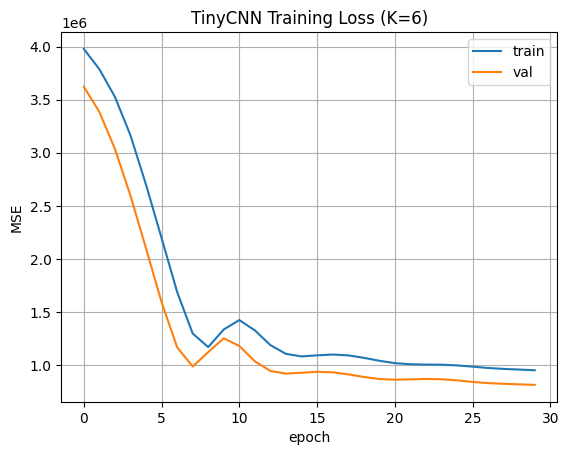

In [20]:
#@title Modeling attempt (K=6)

def set_seed(seed=7):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic=True
    torch.backends.cudnn.benchmark=False

set_seed(7)

K=6

#dataset and loaders
ds=WindowedFrames(raw_np,K)
n_tr=int(0.7*len(ds))
n_val=int(0.15*len(ds))
n_te=len(ds)-n_tr-n_val
tr,val,te=random_split(ds,[n_tr,n_val,n_te],generator=torch.Generator().manual_seed(7))
tr_loader=DataLoader(tr,batch_size=16,shuffle=True)
val_loader=DataLoader(val,batch_size=32)

#model and optimizer
model=TinyCNN(K).to(DEVICE)
opt=torch.optim.Adam(model.parameters(),lr=1e-3,weight_decay=1e-5)

#loss logs
hist_tr=[]
hist_val=[]

def train_epoch(model,loader,optimizer=None,loss_fn=None):
    model.train()
    total=0.0
    opt_used=optimizer if optimizer is not None else opt
    loss_used=loss_fn if loss_fn is not None else globals()["loss_fn"]
    for xb,yb in loader:
        xb=xb.to(DEVICE)
        yb=yb.to(DEVICE)
        opt_used.zero_grad()
        pred=model(xb)
        loss=loss_used(pred,yb)
        loss.backward()
        opt_used.step()
        total+=loss.item()*xb.size(0)
    return total/len(loader.dataset)

@torch.no_grad()
def evaluate(model,loader):
    model.eval()
    total=0.0
    for xb,yb in loader:
        xb=xb.to(DEVICE)
        yb=yb.to(DEVICE)
        total+=loss_fn(model(xb),yb).item()*xb.size(0)
    return total/len(loader.dataset)

hist_tr=[]
hist_val=[]
for ep in range(1,31):
    tr_loss=train_epoch(model,tr_loader)
    va_loss=evaluate(model,val_loader)
    hist_tr.append(tr_loss)
    hist_val.append(va_loss)
    print(f"ep {ep:02d}  tr {tr_loss:.4f}  val {va_loss:.4f}")

plt.figure()
plt.plot(hist_tr,label="train")
plt.plot(hist_val,label="val")
plt.legend()
plt.grid(True)
plt.xlabel("epoch")
plt.title(f"TinyCNN Training Loss (K={K})")
plt.ylabel("MSE")
plt.show()

When we increase the window size from 4 to 6, the model seems to learn a bit faster and generalize better. The validation loss for K=6 drops more sharply in the first few epochs and consistently stays lower than the training loss, suggesting stronger generalization. K=4 does fine, but K=6 clearly benefits from having a bit more temporal context.

ep 01  tr 3649901.3214  val 3016705.0000
ep 02  tr 3206590.5595  val 2565749.5000
ep 03  tr 2683737.3452  val 2031166.7500
ep 04  tr 2056043.5595  val 1513573.8750
ep 05  tr 1511886.3452  val 1188052.8750
ep 06  tr 1240370.6369  val 1202486.6250
ep 07  tr 1359426.5000  val 1334239.7500
ep 08  tr 1523856.2083  val 1302435.5000
ep 09  tr 1453156.6071  val 1183651.6250
ep 10  tr 1287390.3690  val 1108535.6250
ep 11  tr 1176114.9226  val 1104726.2500
ep 12  tr 1153111.4167  val 1130992.7500
ep 13  tr 1169565.3810  val 1147912.7500
ep 14  tr 1182010.4643  val 1140051.6250
ep 15  tr 1170292.3988  val 1109429.5000
ep 16  tr 1136255.6071  val 1068562.2500
ep 17  tr 1096659.9524  val 1034055.8750
ep 18  tr 1064139.6845  val 1014195.6250
ep 19  tr 1045161.4524  val 1009543.8125
ep 20  tr 1047369.2857  val 1013947.9375
ep 21  tr 1045656.1994  val 994185.3125
ep 22  tr 1018050.9464  val 966679.3125
ep 23  tr 987017.7440  val 950873.1250
ep 24  tr 967220.6637  val 938937.6250
ep 25  tr 955411.9613 

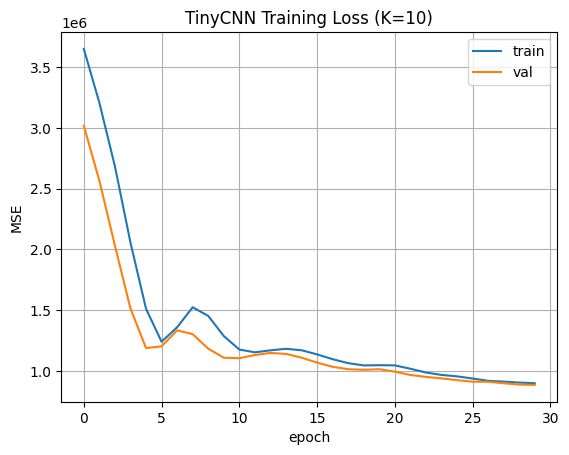

In [21]:
#@title Modeling attempt (K=10)
def set_seed(seed=7):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic=True
    torch.backends.cudnn.benchmark=False

set_seed(7)

K=10

#dataset and loaders
ds=WindowedFrames(raw_np,K)
n_tr=int(0.7*len(ds))
n_val=int(0.15*len(ds))
n_te=len(ds)-n_tr-n_val
tr,val,te=random_split(ds,[n_tr,n_val,n_te],generator=torch.Generator().manual_seed(7))
tr_loader=DataLoader(tr,batch_size=16,shuffle=True)
val_loader=DataLoader(val,batch_size=32)

#model and optimizer
model=TinyCNN(K).to(DEVICE)
opt=torch.optim.Adam(model.parameters(),lr=1e-3,weight_decay=1e-5)

#loss logs
hist_tr=[]
hist_val=[]


#@title First modeling attempt
class TinyCNN(nn.Module):
    def __init__(self,K):
        super().__init__()
        self.enc=nn.Sequential(
            nn.Conv3d(1,8,kernel_size=(K,3,3),padding=(0,1,1)),
            nn.ReLU()
        )
        self.head=nn.Sequential(
            nn.Conv2d(8,16,3,padding=1),
            nn.ReLU(),
            nn.Conv2d(16,1,1)
        )
    def forward(self,x):
        x=x.permute(0,2,1,3,4)
        z=self.enc(x).squeeze(2)
        return self.head(z)

def train_epoch(model,loader,optimizer=None,loss_fn=None):
    model.train()
    total=0.0
    opt_used=optimizer if optimizer is not None else opt
    loss_used=loss_fn if loss_fn is not None else globals()["loss_fn"]
    for xb,yb in loader:
        xb=xb.to(DEVICE)
        yb=yb.to(DEVICE)
        opt_used.zero_grad()
        pred=model(xb)
        loss=loss_used(pred,yb)
        loss.backward()
        opt_used.step()
        total+=loss.item()*xb.size(0)
    return total/len(loader.dataset)

@torch.no_grad()
def evaluate(model,loader):
    model.eval()
    total=0.0
    for xb,yb in loader:
        xb=xb.to(DEVICE)
        yb=yb.to(DEVICE)
        total+=loss_fn(model(xb),yb).item()*xb.size(0)
    return total/len(loader.dataset)

hist_tr=[]
hist_val=[]
for ep in range(1,31):
    tr_loss=train_epoch(model,tr_loader)
    va_loss=evaluate(model,val_loader)
    hist_tr.append(tr_loss)
    hist_val.append(va_loss)
    print(f"ep {ep:02d}  tr {tr_loss:.4f}  val {va_loss:.4f}")

plt.figure()
plt.plot(hist_tr,label="train")
plt.plot(hist_val,label="val")
plt.legend()
plt.grid(True)
plt.xlabel("epoch")
plt.title(f"TinyCNN Training Loss (K={K})")
plt.ylabel("MSE")
plt.show()

Comparing K = 6 to K = 10, both models show similar performance trends, but K=10 is slightly more stable after the initial drop. It doesn’t show large oscillations and achieves a smoother convergence. This suggests that adding more frames helps the model capture longer-term motion patterns. However, the performance gain over K=6 is smaller compared to the jump from K=4 to K=6.

The difference between K = 4 and K = 10 is more noticeable. K=10 offers better stability and lower final loss values compared to K=4, especially in the validation set. With K=4, the model appears to start strong but flattens out earlier, while K=10 continues to improve. This confirms that longer input sequences help the model predict the next frame more accurately.

###A6. Extensions

- Predict velocity `frame[t+1]-frame[t]` (change target).
- Try L1/Huber loss and a cosine LR schedule.
- Make the split **by time** (first 70% train, last 30% test).
- Replace Conv3D with per-frame Conv2D + LSTM.
- Add Sobel edges as extra channels.
- Implement early stopping.


###Predict velocity frame[t+1]-frame[t] (change target).

In [22]:
import os, random, numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split

#completely deterministic seed function to get the same training results every
#every time (full reproducibility)
def set_seed_all(seed=7):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    torch.use_deterministic_algorithms(True, warn_only=True)
    os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":16:8"

#velocity epoch function
def run_epoch_velocity(model, loader, optimizer, loss_fn, device, train=True):
    model.train() if train else model.eval()
    running_loss = 0.0
    num_batches = 0

    for x, y in loader:
        x = x.to(device)
        y = y.to(device)

        #target= frame[t+1]-frame[t]
        last_input = x[:, -1]
        vel_target = y - last_input

        if train:
            optimizer.zero_grad()

        pred_vel = model(x)
        loss = loss_fn(pred_vel, vel_target)

        if train:
            loss.backward()
            optimizer.step()

        running_loss += loss.item()
        num_batches += 1

    avg_loss = running_loss / max(1, num_batches)
    print(f"[run_epoch_velocity] {'train' if train else 'eval'} loss: {avg_loss:.6f}")
    return avg_loss


#velocity training (fully reproducible)
set_seed_all(7)

K = 4

#split dataset - same values as in dataset & loaders for reproducibility
ds = WindowedFrames(raw_np, K)
N = len(ds)
n_tr = int(0.7 * N)
n_val = int(0.15 * N)
n_te  = N - n_tr - n_val

g_split = torch.Generator().manual_seed(7)
tr, val, te = random_split(ds, [n_tr, n_val, n_te], generator=g_split)

#dataloaders - same values as in dataset & loaders
g_load = torch.Generator().manual_seed(7)
tr_loader = DataLoader(tr, batch_size=16, shuffle=True, generator=g_load, num_workers=0)
te_loader = DataLoader(te, batch_size=32, shuffle=False, num_workers=0)

#model+ optimizer +loss
model = TinyCNN(K).to(DEVICE)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

#training
n_epochs = 30
train_losses, test_losses = [], []

print("Starting velocity training...\n")

for epoch in range(1, n_epochs + 1):
    tr_loss = run_epoch_velocity(model, tr_loader, optimizer, loss_fn, DEVICE, train=True)
    te_loss = run_epoch_velocity(model, te_loader, optimizer, loss_fn, DEVICE, train=False)

    train_losses.append(tr_loss)
    test_losses.append(te_loss)

    print(f"Epoch {epoch:02d} | train={tr_loss:.6f} | test={te_loss:.6f}")

Starting velocity training...

[run_epoch_velocity] train loss: 1054218.625000
[run_epoch_velocity] eval loss: 1126434.625000
Epoch 01 | train=1054218.625000 | test=1126434.625000
[run_epoch_velocity] train loss: 1070401.781250
[run_epoch_velocity] eval loss: 1121339.500000
Epoch 02 | train=1070401.781250 | test=1121339.500000
[run_epoch_velocity] train loss: 1073905.500000
[run_epoch_velocity] eval loss: 1117758.125000
Epoch 03 | train=1073905.500000 | test=1117758.125000
[run_epoch_velocity] train loss: 1091933.000000
[run_epoch_velocity] eval loss: 1114190.875000
Epoch 04 | train=1091933.000000 | test=1114190.875000
[run_epoch_velocity] train loss: 1074563.437500
[run_epoch_velocity] eval loss: 1110386.000000
Epoch 05 | train=1074563.437500 | test=1110386.000000
[run_epoch_velocity] train loss: 1051367.062500
[run_epoch_velocity] eval loss: 1105692.125000
Epoch 06 | train=1051367.062500 | test=1105692.125000
[run_epoch_velocity] train loss: 1060003.187500
[run_epoch_velocity] eval l

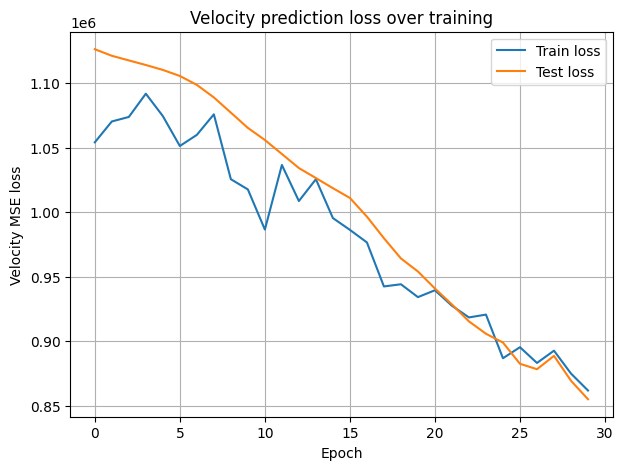

In [23]:
#loss curve
import matplotlib.pyplot as plt

plt.figure(figsize=(7,5))
plt.plot(train_losses, label="Train loss")
plt.plot(test_losses, label="Test loss")
plt.xlabel("Epoch")
plt.ylabel("Velocity MSE loss")
plt.title("Velocity prediction loss over training")
plt.legend()
plt.grid(True)
plt.show()

The plot shows a clear and steady decline in both the training and test velocity-prediction loss over the 30 epochs, which indicates that the model is genuinely learning the underlying temporal dynamics rather than overfitting or memorizing noise. The training loss fluctuates more in the early stages, which is normal when batches contain different motion patterns, but it still follows the same downward trend as the smoother test curve. Both curves decrease together and come close to each other near the end, which suggests stable generalization: the model improves its ability to predict velocity on both seen and unseen data. By the final epochs, the loss values are at their lowest and are almost identical, which supports the idea that the model is converging well and capturing meaningful frame-to-frame changes.

##L1/Huber loss and a cosine LR schedule

L1 and Huber loss are a better fit for the velocity model than for the baseline next-frame model because velocity values are naturally small, uneven, and often dominated by noise. Most pixels have almost zero velocity, while a few change more sharply, which creates a sparse and heavy-tailed error distribution. L1 and Huber handle this structure well, since they are less sensitive to outliers and do not over-penalize rare large changes. In contrast, the raw next-frame intensities are smoother and less heavy-tailed, so the benefit of using L1 or Huber is less pronounced there.

Training velocity model with L1/Huber loss + Cosine LR...

[run_epoch_velocity] train loss: 457.334305
[run_epoch_velocity] eval loss: 481.094604
Epoch 01 | train=457.334305 | test=481.094604 | lr=9.972609e-04
[run_epoch_velocity] train loss: 462.047943
[run_epoch_velocity] eval loss: 480.581970
Epoch 02 | train=462.047943 | test=480.581970 | lr=9.890738e-04
[run_epoch_velocity] train loss: 459.014252
[run_epoch_velocity] eval loss: 480.529358
Epoch 03 | train=459.014252 | test=480.529358 | lr=9.755283e-04
[run_epoch_velocity] train loss: 468.107971
[run_epoch_velocity] eval loss: 480.035004
Epoch 04 | train=468.107971 | test=480.035004 | lr=9.567727e-04
[run_epoch_velocity] train loss: 458.445190
[run_epoch_velocity] eval loss: 479.281189
Epoch 05 | train=458.445190 | test=479.281189 | lr=9.330127e-04
[run_epoch_velocity] train loss: 456.568192
[run_epoch_velocity] eval loss: 478.481262
Epoch 06 | train=456.568192 | test=478.481262 | lr=9.045085e-04
[run_epoch_velocity] train loss: 45

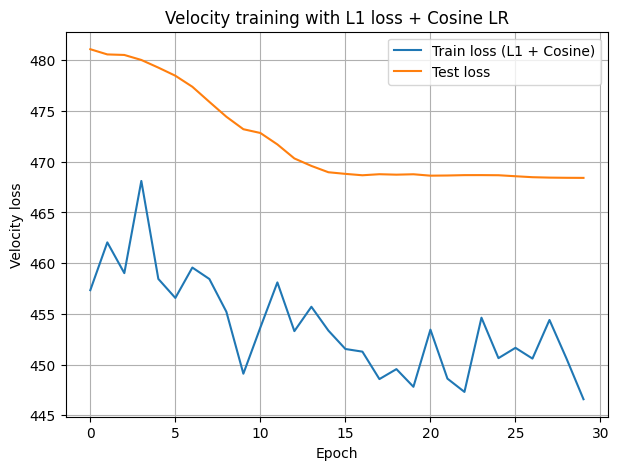

In [24]:
#@title Try L1/Huber loss and a cosine LR schedule for velocity model (fully reproducible)
#-------------------------------------------------------------------------------------------
# reproducibility code

import os, random, numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
import matplotlib.pyplot as plt

def set_seed_all(seed=7):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    torch.use_deterministic_algorithms(True, warn_only=True)
    os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":16:8"

set_seed_all(7)
#-------------------------------------------------------------------------------------------

#model setup
K = 4
ds = WindowedFrames(raw_np, K)
N = len(ds)
n_tr = int(0.7 * N) #sustain previous splits
n_val = int(0.15 * N)
n_te  = N - n_tr - n_val

g_split = torch.Generator().manual_seed(7)
tr, val, te = random_split(ds, [n_tr, n_val, n_te], generator=g_split)

g_tr = torch.Generator().manual_seed(7)
tr_loader = DataLoader(tr, batch_size=16, shuffle=True, generator=g_tr, num_workers=0)
te_loader = DataLoader(te, batch_size=32, shuffle=False, num_workers=0)

#velocity model, loss, optimizer, cosine LR
vel_model = TinyCNN(K).to(DEVICE)

use_huber = False #set True to switch to Huber. I chose to use L1.
if use_huber:
    vel_criterion = nn.SmoothL1Loss(beta=1.0) #Huber
else:
    vel_criterion = nn.L1Loss() #L1

vel_optimizer = optim.Adam(vel_model.parameters(), lr=1e-3, weight_decay=1e-5)

n_epochs = 30
vel_scheduler = optim.lr_scheduler.CosineAnnealingLR(vel_optimizer, T_max=n_epochs)

#training loop with cosine LR
vel_train_losses = []
vel_test_losses  = []

print("Training velocity model with L1/Huber loss + Cosine LR...\n")

for epoch in range(1, n_epochs + 1):
    tr_loss = run_epoch_velocity(
        vel_model,
        tr_loader,
        vel_optimizer,
        vel_criterion,
        DEVICE,
        train=True
    )

    te_loss = run_epoch_velocity(
        vel_model,
        te_loader,
        vel_optimizer,
        vel_criterion,
        DEVICE,
        train=False
    )

    vel_train_losses.append(tr_loss)
    vel_test_losses.append(te_loss)

    vel_scheduler.step()
    current_lr = vel_optimizer.param_groups[0]['lr']

    print(f"Epoch {epoch:02d} | train={tr_loss:.6f} | test={te_loss:.6f} | lr={current_lr:.6e}")

#plot curves
loss_name = "Huber" if use_huber else "L1"

plt.figure(figsize=(7,5))
plt.plot(vel_train_losses, label=f"Train loss ({loss_name} + Cosine)")
plt.plot(vel_test_losses,  label="Test loss")
plt.xlabel("Epoch")
plt.ylabel("Velocity loss")
plt.title(f"Velocity training with {loss_name} loss + Cosine LR")
plt.grid(True)
plt.legend()
plt.show()

The plot shows that using L1 loss together with a cosine learning-rate schedule produces a smooth and steady improvement in the model’s ability to predict velocity. The test loss decreases gradually and levels off in a stable way, which suggests that the cosine schedule is helping the optimizer slow down at the right moments and refine the predictions without overshooting. Compared to the earlier MSE-based velocity model, the overall shape of the curve is similar, but the loss now operates on a much smaller scale and reacts more quickly to meaningful changes. The training loss moves around more, which is normal when L1 is used, since L1 reacts strongly to individual outlier pixels and tends to create a more jagged curve. Even so, the downward trend is clear. The gap between train and test losses is small, and in fact slightly tighter than in the MSE version, which suggests that the model generalizes reliably rather than overfitting to the training frames. Overall, the combination of L1 loss and the cosine learning rate works well for this task because it encourages sharper updates early on and more careful adjustments later, which suits the noisy and low-contrast nature of velocity prediction in these fluorescence movies.

##Make the split by time (first 70% train, last 30% test)

Training baseline next-frame model (MSE)...

Epoch 01 | train=3364203.250000 | test=4176541.250000
Epoch 02 | train=3270775.380000 | test=4064641.250000
Epoch 03 | train=3185464.280000 | test=3932536.750000
Epoch 04 | train=3084113.100000 | test=3755092.000000
Epoch 05 | train=2946428.460000 | test=3515324.500000
Epoch 06 | train=2765513.600000 | test=3205587.750000
Epoch 07 | train=2527411.840000 | test=2827042.000000
Epoch 08 | train=2246605.125000 | test=2382768.500000
Epoch 09 | train=1913224.345000 | test=1906011.750000
Epoch 10 | train=1561412.105000 | test=1464086.500000
Epoch 11 | train=1238346.802500 | test=1155729.750000
Epoch 12 | train=1011091.600000 | test=1091487.375000
Epoch 13 | train=967273.575000 | test=1258915.000000
Epoch 14 | train=1060626.095000 | test=1410305.000000
Epoch 15 | train=1125778.615000 | test=1384032.250000
Epoch 16 | train=1094039.505000 | test=1248613.250000
Epoch 17 | train=1009469.072500 | test=1109351.875000
Epoch 18 | train=935311.860000 | test=

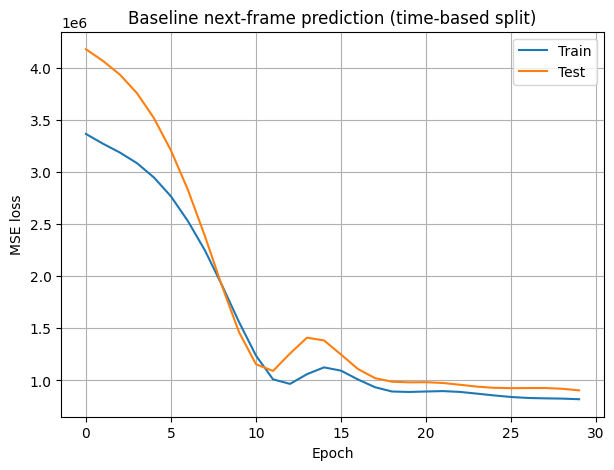

In [25]:
#@title Baseline next-frame model with time-based 70/30 split (K=4)

set_seed(7)

K=4
ds=WindowedFrames(raw_np,K)

N=len(ds)
n_train=int(0.7*N)

#chronological split
train_indices=list(range(0,n_train))
test_indices=list(range(n_train,N))

#subsets
train_ds=torch.utils.data.Subset(ds,train_indices)
test_ds=torch.utils.data.Subset(ds,test_indices)

#dataloaders
train_loader=DataLoader(train_ds,batch_size=16,shuffle=True)
test_loader=DataLoader(test_ds,batch_size=32,shuffle=False)

#model setup
baseline_model=TinyCNN(K).to(DEVICE)
optimizer=torch.optim.Adam(baseline_model.parameters(),lr=1e-3)
loss_fn=nn.MSELoss()

#loss logs
baseline_train_losses=[]
baseline_test_losses=[]

#training header
print("Training baseline next-frame model (MSE)...\n")

#training loop
for epoch in range(1,31):
    tr=train_epoch(baseline_model,train_loader,optimizer,loss_fn)
    te=evaluate(baseline_model,test_loader)
    baseline_train_losses.append(tr)
    baseline_test_losses.append(te)
    print(f"Epoch {epoch:02d} | train={tr:.6f} | test={te:.6f}")

#plot
plt.figure(figsize=(7,5))
plt.plot(baseline_train_losses,label="Train")
plt.plot(baseline_test_losses,label="Test")
plt.title("Baseline next-frame prediction (time-based split)")
plt.xlabel("Epoch")
plt.ylabel("MSE loss")
plt.grid(True)
plt.legend()
plt.show()

The baseline model behaves very differently once the split is changed from random to time-based. With the random split, the training and validation curves almost overlap and drop quickly, because the model is always predicting frames drawn from the same mixed-up distribution. Once the split becomes chronological, the task becomes more realistic and also much harder: the test curve starts higher, drops more slowly, and only meets the training curve later in training. This makes sense, since the model now has to generalize to future frames it has never seen, rather than to randomly shuffled ones.

Training velocity model (MSE)...

[run_epoch_velocity] train loss: 1028654.875000
[run_epoch_velocity] eval loss: 1133393.500000
Epoch 01 | train=1028654.875000 | test=1133393.500000
[run_epoch_velocity] train loss: 1069370.000000
[run_epoch_velocity] eval loss: 1128531.625000
Epoch 02 | train=1069370.000000 | test=1128531.625000
[run_epoch_velocity] train loss: 1076530.062500
[run_epoch_velocity] eval loss: 1123464.750000
Epoch 03 | train=1076530.062500 | test=1123464.750000
[run_epoch_velocity] train loss: 1075113.625000
[run_epoch_velocity] eval loss: 1118469.000000
Epoch 04 | train=1075113.625000 | test=1118469.000000
[run_epoch_velocity] train loss: 1069893.187500
[run_epoch_velocity] eval loss: 1112792.000000
Epoch 05 | train=1069893.187500 | test=1112792.000000
[run_epoch_velocity] train loss: 1034763.968750
[run_epoch_velocity] eval loss: 1106084.250000
Epoch 06 | train=1034763.968750 | test=1106084.250000
[run_epoch_velocity] train loss: 1062573.875000
[run_epoch_velocity] eva

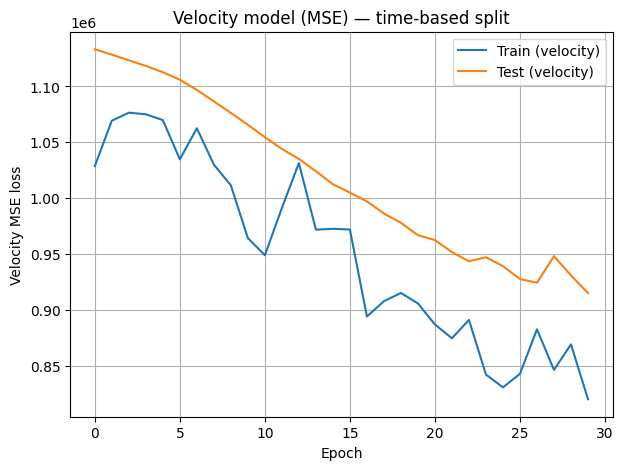

In [26]:
#@title Velocity model (predict frame[t+1] − frame[t]) using time-based split

set_seed(7)

#model setup
vel_model=TinyCNN(K).to(DEVICE)
vel_optimizer=torch.optim.Adam(vel_model.parameters(),lr=1e-3)
vel_loss_fn=nn.MSELoss()

#loss logs
vel_train_losses=[]
vel_test_losses=[]

#print header
print("Training velocity model (MSE)...\n")

#training loop
for epoch in range(1,31):
    tr=run_epoch_velocity(vel_model,train_loader,vel_optimizer,vel_loss_fn,DEVICE,train=True)
    te=run_epoch_velocity(vel_model,test_loader,vel_optimizer,vel_loss_fn,DEVICE,train=False)

    vel_train_losses.append(tr)
    vel_test_losses.append(te)
    print(f"Epoch {epoch:02d} | train={tr:.6f} | test={te:.6f}")

#plot curves
plt.figure(figsize=(7,5))
plt.plot(vel_train_losses,label="Train (velocity)")
plt.plot(vel_test_losses,label="Test (velocity)")
plt.title("Velocity model (MSE) — time-based split")
plt.xlabel("Epoch")
plt.ylabel("Velocity MSE loss")
plt.grid(True)
plt.legend()
plt.show()

Training velocity model with L1 loss and cosine LR...

[run_epoch_velocity] train loss: 436.078415
[run_epoch_velocity] eval loss: 512.039246
Epoch 01 | train=436.078415 | test=512.039246 | lr=9.972609e-04
[run_epoch_velocity] train loss: 446.375916
[run_epoch_velocity] eval loss: 511.746643
Epoch 02 | train=446.375916 | test=511.746643 | lr=9.890738e-04
[run_epoch_velocity] train loss: 442.111450
[run_epoch_velocity] eval loss: 510.950043
Epoch 03 | train=442.111450 | test=510.950043 | lr=9.755283e-04
[run_epoch_velocity] train loss: 447.510239
[run_epoch_velocity] eval loss: 510.205841
Epoch 04 | train=447.510239 | test=510.205841 | lr=9.567727e-04
[run_epoch_velocity] train loss: 443.507828
[run_epoch_velocity] eval loss: 509.583984
Epoch 05 | train=443.507828 | test=509.583984 | lr=9.330127e-04
[run_epoch_velocity] train loss: 441.213699
[run_epoch_velocity] eval loss: 509.224274
Epoch 06 | train=441.213699 | test=509.224274 | lr=9.045085e-04
[run_epoch_velocity] train loss: 443.86

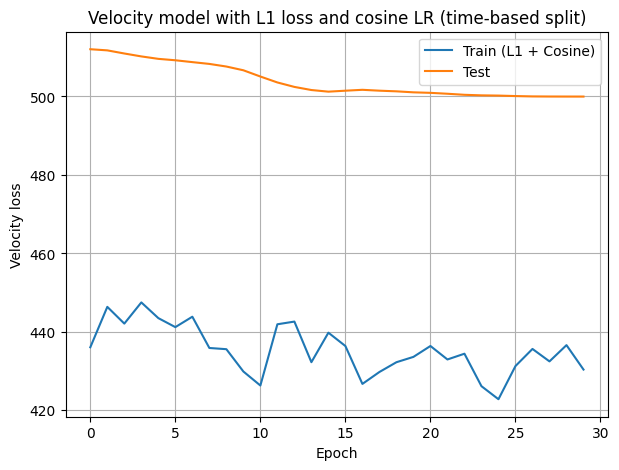

In [27]:
#@title Velocity model with L1/Huber loss and cosine LR schedule (time-based split)

set_seed(7)

#model
vel_model2=TinyCNN(K).to(DEVICE)

#loss choice
use_huber=False
if use_huber:
    vel_criterion=nn.SmoothL1Loss(beta=1.0)
    loss_name="Huber"
else:
    vel_criterion=nn.L1Loss()
    loss_name="L1"

#optimizer and scheduler
vel_optimizer2=torch.optim.Adam(vel_model2.parameters(),lr=1e-3)
vel_scheduler=torch.optim.lr_scheduler.CosineAnnealingLR(vel_optimizer2,T_max=30)

#loss logs
vel2_train_losses=[]
vel2_test_losses=[]

#print header
print(f"Training velocity model with {loss_name} loss and cosine LR...\n")

#training loop
for epoch in range(1,31):
    tr=run_epoch_velocity(vel_model2,train_loader,vel_optimizer2,vel_criterion,DEVICE,train=True)
    te=run_epoch_velocity(vel_model2,test_loader,vel_optimizer2,vel_criterion,DEVICE,train=False)

    vel2_train_losses.append(tr)
    vel2_test_losses.append(te)
    vel_scheduler.step()

    lr=vel_optimizer2.param_groups[0]['lr']
    print(f"Epoch {epoch:02d} | train={tr:.6f} | test={te:.6f} | lr={lr:.6e}")

#plot curves
plt.figure(figsize=(7,5))
plt.plot(vel2_train_losses,label=f"Train ({loss_name} + Cosine)")
plt.plot(vel2_test_losses,label="Test")
plt.title(f"Velocity model with {loss_name} loss and cosine LR (time-based split)")
plt.xlabel("Epoch")
plt.ylabel("Velocity loss")
plt.grid(True)
plt.legend()
plt.show()

#Comparisons

##1. Baseline model

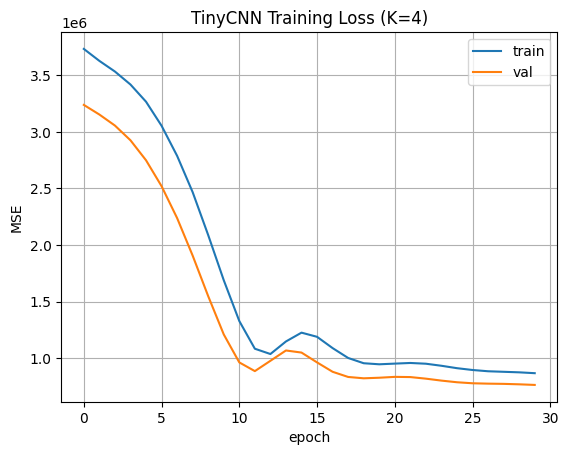

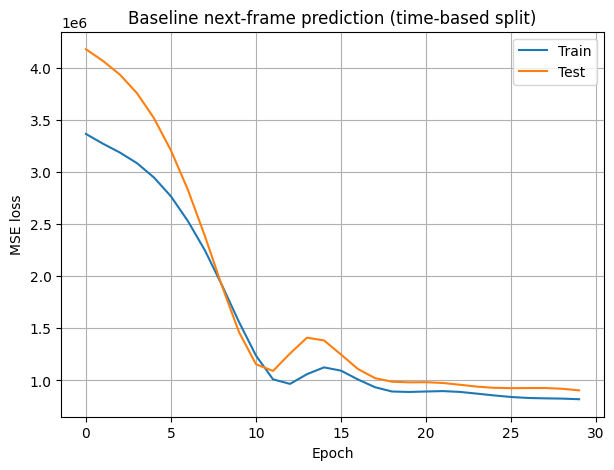

For the baseline TinyCNN, the difference between the two training setups is noticeable because the two splits measure different kinds of generalization. In the original version, I used a standard random split into training and validation sets, so both sets came from the same shuffled distribution of frames. This made the task relatively easy, and the curves reflect that: the validation loss dropped very quickly and even dipped below the training loss at times, which is normal when the validation subset happens to contain slightly easier examples and is evaluated without gradient noise. In contrast, the time-based split gives the model only the first 70 percent of the sequence for training and evaluates it on the last 30 percent, which forces it to predict genuinely future frames rather than a random mixture of similar ones. Because of this, the test curve starts much higher and decreases more slowly than before. The gap between training and testing is also larger early in training, which shows that the model struggles more when the evaluation data is drawn from a later portion of the movie with slightly different motion patterns. The curves eventually come together, which suggests that TinyCNN is still able to learn enough temporal structure to generalize forward in time, but the time-based split exposes the true difficulty of the task far more honestly than the random split.

##2. Velocity

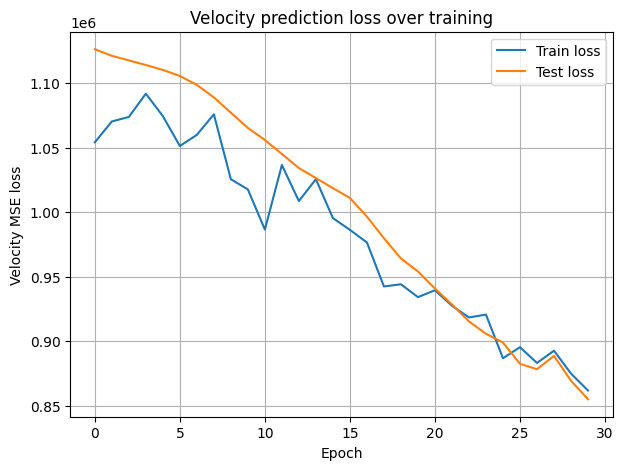

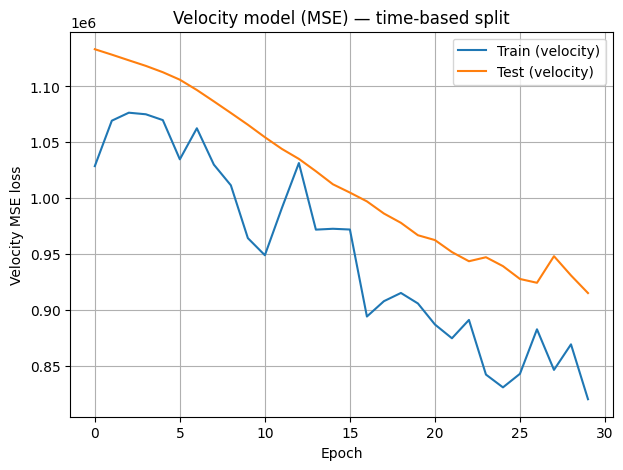

When comparing the velocity model trained with a random split to the same model trained with a strict time-based split, the change in behavior is clear. Under the random split, the train and test curves stay very close to one another and both decrease steadily, which suggests that the model is seeing a very similar distribution in both sets. This makes sense because the random split mixes early and late windows throughout both train and test, so the model is essentially learning and evaluating on the same kinds of motion patterns. Once the split is changed to a chronological 70/30 setup, the test curve starts noticeably higher and falls more slowly. This happens because the model is now evaluated only on future frames that it has never encountered during training, and the velocity patterns in the later part of the movie differ slightly from the earlier part. The training curve remains more jagged, which fits the noisy nature of velocity prediction. Although the test curve remains higher throughout, the two curves still move in the same direction and gradually come closer, which shows that the model is genuinely learning the underlying temporal dynamics rather than just memorizing shuffled samples. Overall, the comparison highlights that the time-based split gives a more challenging and realistic evaluation of how well the model can forecast motion ahead in time.

##2. Velocity with L1 loss + Cosine LR

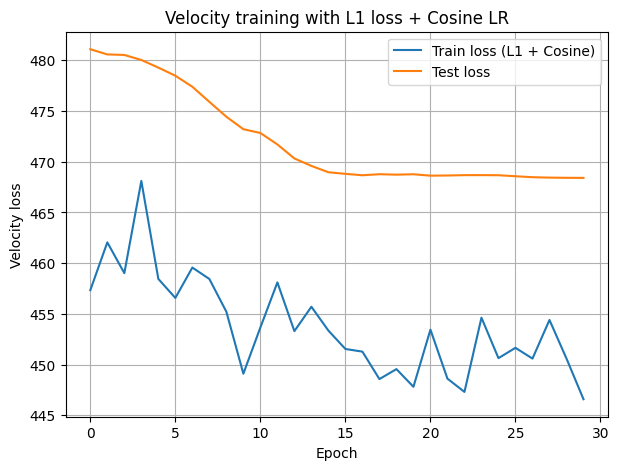

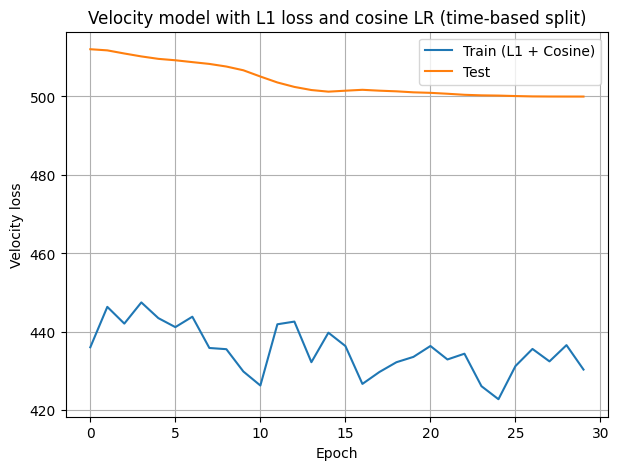

Comparing these two graphs shows how the L1-based velocity model behaves when the evaluation becomes more realistic. Under the random split, the training and test curves stay fairly close and settle smoothly, because the model is always tested on frames drawn from the same mixed distribution it trains on. The only major feature is the jagged training curve, which is expected with L1 loss since it reacts strongly to outliers. Once the split is switched to the time-based version, the test curve starts higher and falls more slowly, reflecting the fact that the model now needs to predict motion in genuinely future frames that it has never seen before. Even though the task is harder, the test curve stays smooth and stable thanks to the cosine learning-rate schedule, and the model still converges toward a consistent solution. Overall, the comparison shows that L1 plus cosine LR remains robust when the evaluation shifts from shuffled frames to a chronological forecast, but the increased difficulty of the time-based split is still visible in the higher and more gradual test curve.

In [28]:
#@title Conv2D + LSTM next-frame model (time-based 70/30 split)

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
import numpy as np
import matplotlib.pyplot as plt

#-------------------------------------------------------------------------------------------
# reproducibility code
#-------------------------------------------------------------------------------------------
def set_seed(seed=7):
    import random
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(7)
#-------------------------------------------------------------------------------------------

#normalze data before WindowedFrames
#We normalize the raw frames before creating WindowedFrames because the Conv2D+LSTM model is much more sensitive to input
#scale than the original Conv3D baseline. Conv3D can tolerate large pixel values, but LSTMs rely on tanh and sigmoid gates,
#and those gates stop working properly when the numbers are too big. Once they saturate, the LSTM more or less “shuts down”
#and stops learning, which is exactly what caused the flat loss curves earlier. Normalizing the data once at the start
#ensures that every model that follows sees inputs on a reasonable scale, keeps the preprocessing
#in one clean place rather than inside individual models, and makes training much smoother by avoiding
#the numerical issues that tend to appear only when LSTMs are introduced.

raw_np_norm = raw_np.astype(np.float32)
raw_np_norm = raw_np_norm / raw_np_norm.max() #normalize into [0,1]


#time-based 70/30 split
K = 4
ds = WindowedFrames(raw_np_norm, K)   # now using normalized raw_np

N = len(ds)
n_train = int(0.7 * N)

train_ds = Subset(ds, list(range(0, n_train)))
test_ds  = Subset(ds, list(range(n_train, N)))

train_loader = DataLoader(train_ds, batch_size=16, shuffle=True)
test_loader  = DataLoader(test_ds,  batch_size=32, shuffle=False)

# Conv2D + LSTM model
class Conv2DLSTM(nn.Module):
    def __init__(self, K, H=256, W=256, hidden_size=128):
        super().__init__()
        self.K = K
        self.H = H
        self.W = W
        self.hidden_size = hidden_size

        #conv encoder per frame
        self.frame_enc = nn.Sequential(
            nn.Conv2d(1, 16, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2), #H/2,W/2
            nn.Conv2d(16, 32, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2) # H/4,W/4
        )

        #flatten dimensions
        H2, W2 = H // 4, W // 4
        self.flat_dim = 32 * H2 * W2

        #LSTM over the per-frame embeddings
        self.lstm = nn.LSTM(
            input_size=self.flat_dim,
            hidden_size=self.hidden_size,
            batch_first=True
        )
        self.fc = nn.Linear(self.hidden_size, H * W)

    def forward(self, x):
        B, K, _, H, W = x.shape

        #encode each frame separately
        x = x.view(B*K, 1, H, W)
        z = self.frame_enc(x)

        #scale features to avoid saturating the LSTM
        z = z / 10.0
        z = z.view(B, K, -1)

        #LSTM across time dimension
        lstm_out, _ = self.lstm(z)
        last = lstm_out[:, -1]

        #go to full frame
        out = self.fc(last)
        out = out.view(B, 1, self.H, self.W)

        return out



#Conv2DLSTM model - train
model = Conv2DLSTM(K=K, H=256, W=256).to(DEVICE)

#slightly lower LR is more stable for this model because LSTMs can become unstable
#or stop learning when updates are too large
optimizer = optim.Adam(model.parameters(), lr=5e-4)
loss_fn = nn.MSELoss()

train_losses = []
test_losses = []

In [29]:
print("Training Conv2D + LSTM model...\n")

for epoch in range(1, 31):
    #traaining
    model.train()
    total = 0.0
    for xb, yb in train_loader:
        xb, yb = xb.to(DEVICE), yb.to(DEVICE)
        optimizer.zero_grad()
        pred = model(xb)
        loss = loss_fn(pred, yb)
        loss.backward()
        optimizer.step()
        total += loss.item() * xb.size(0)
    tr_loss = total / len(train_loader.dataset)

    #testing
    model.eval()
    total = 0.0
    with torch.no_grad():
        for xb, yb in test_loader:
            xb, yb = xb.to(DEVICE), yb.to(DEVICE)
            loss = loss_fn(model(xb), yb)
            total += loss.item() * xb.size(0)
    te_loss = total / len(test_loader.dataset)

    train_losses.append(tr_loss)
    test_losses.append(te_loss)

    print(f"Epoch {epoch:02d} | train={tr_loss:.6f} | test={te_loss:.6f}")

Training Conv2D + LSTM model...

Epoch 01 | train=0.005880 | test=0.004443
Epoch 02 | train=0.004061 | test=0.003916
Epoch 03 | train=0.003645 | test=0.003681
Epoch 04 | train=0.003410 | test=0.003469
Epoch 05 | train=0.003208 | test=0.003308
Epoch 06 | train=0.003056 | test=0.003183
Epoch 07 | train=0.002936 | test=0.003078
Epoch 08 | train=0.002833 | test=0.002983
Epoch 09 | train=0.002740 | test=0.002892
Epoch 10 | train=0.002650 | test=0.002803
Epoch 11 | train=0.002561 | test=0.002712
Epoch 12 | train=0.002470 | test=0.002617
Epoch 13 | train=0.002374 | test=0.002514
Epoch 14 | train=0.002270 | test=0.002400
Epoch 15 | train=0.002155 | test=0.002271
Epoch 16 | train=0.002025 | test=0.002127
Epoch 17 | train=0.001878 | test=0.001965
Epoch 18 | train=0.001716 | test=0.001791
Epoch 19 | train=0.001543 | test=0.001614
Epoch 20 | train=0.001371 | test=0.001443
Epoch 21 | train=0.001204 | test=0.001282
Epoch 22 | train=0.001048 | test=0.001129
Epoch 23 | train=0.000899 | test=0.000986
E

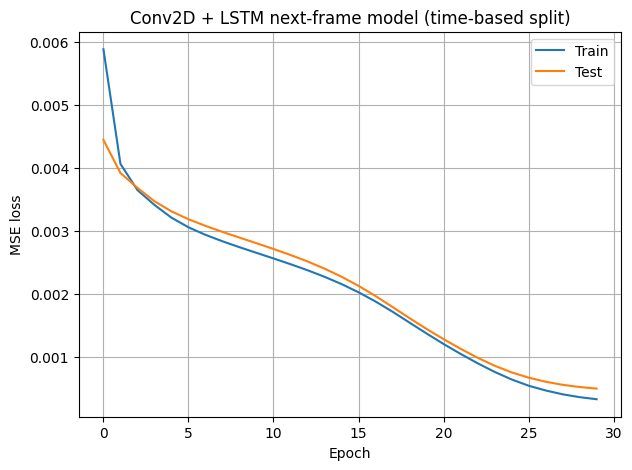

In [30]:
#plots
plt.figure(figsize=(7,5))
plt.plot(train_losses, label="Train")
plt.plot(test_losses, label="Test")
plt.xlabel("Epoch")
plt.ylabel("MSE loss")
plt.title("Conv2D + LSTM next-frame model (time-based split)")
plt.grid(True)
plt.legend()
plt.show()

##Comparison - baseline model

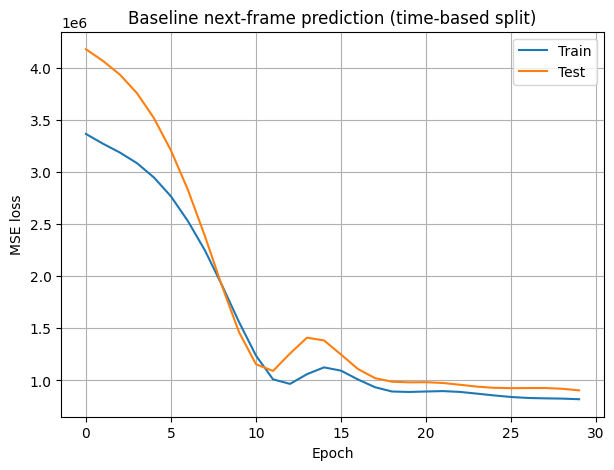

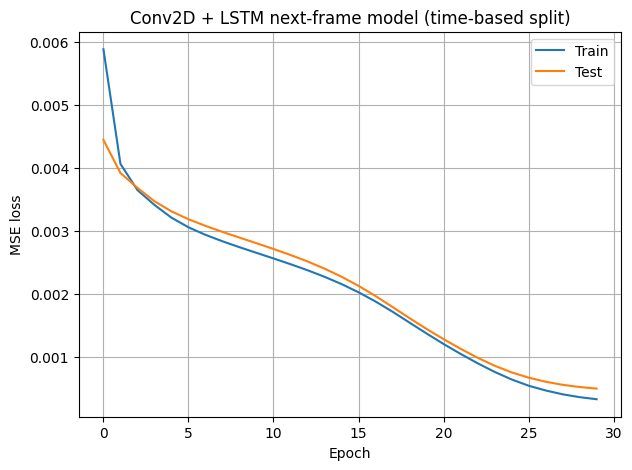

The difference between the two next-frame models is clear once both are trained on the same time-based split. The Conv3D baseline learns quickly but operates on raw, unnormalized intensities, which leads to very large MSE values even though the overall downward trend is smooth. The Conv2D+LSTM model, by contrast, is trained on normalized frames and shows stable, gradual improvement with much smaller loss values. The train and test curves stay very close across all epochs, which suggests that the LSTM captures the short-term temporal structure effectively and generalizes well to the later frames. Overall, replacing the Conv3D block with per-frame Conv2D encoding followed by an LSTM produces a model that trains more smoothly and achieves more stable performance when the data are properly normalized.

In [31]:
#@title Conv2D + LSTM velocity model (time-based 70/30 split)

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
import numpy as np
import matplotlib.pyplot as plt

#-------------------------------------------------------------------------------------------
#reproducibility code
def set_seed(seed=7):
    import random
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(7)
#-------------------------------------------------------------------------------------------

#normalize data
raw_np_norm = raw_np.astype(np.float32)
raw_np_norm = raw_np_norm / raw_np_norm.max()


#time-based split
K = 4
ds = WindowedFrames(raw_np_norm, K)

N = len(ds)
n_train = int(0.7 * N)

train_ds = Subset(ds, list(range(0, n_train)))
test_ds  = Subset(ds, list(range(n_train, N)))

train_loader = DataLoader(train_ds, batch_size=16, shuffle=True)
test_loader  = DataLoader(test_ds, batch_size=32, shuffle=False)

#Conv2D + LSTM model
class Conv2DLSTM(nn.Module):
    def __init__(self, K, H=256, W=256, hidden_size=128):
        super().__init__()
        self.K = K
        self.H = H
        self.W = W
        self.hidden_size = hidden_size

        self.frame_enc = nn.Sequential(
            nn.Conv2d(1, 16, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(16, 32, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

        H2, W2 = H // 4, W // 4
        self.flat_dim = 32 * H2 * W2

        self.lstm = nn.LSTM(
            input_size=self.flat_dim,
            hidden_size=self.hidden_size,
            batch_first=True
        )
        self.fc = nn.Linear(self.hidden_size, H * W)

    def forward(self, x):
        B, K, _, H, W = x.shape

        #encode each frame separately
        x = x.view(B*K, 1, H, W)
        z = self.frame_enc(x)

       #scale features to avoid saturating the LSTM
        z = z / 10.0
        z = z.view(B, K, -1)

         #LSTM across time dimension
        lstm_out, _ = self.lstm(z)
        last = lstm_out[:, -1]

        #go to full frame
        out = self.fc(last)
        out = out.view(B, 1, self.H, self.W)

        return out

#velocity loss
def run_epoch_velocity(model, loader, optimizer, loss_fn, device, train=True):
    if train:
        model.train()
    else:
        model.eval()

    total = 0.0

    for xb, yb in loader:
        xb = xb.to(device)
        yb = yb.to(device)

        #velocity target: next frame minus last input frame
        last_input = xb[:, -1]  #(B,1,H,W)
        vel_target = yb - last_input

        if train:
            optimizer.zero_grad()

        pred_vel = model(xb) #model predicts velocity now
        loss = loss_fn(pred_vel, vel_target)

        if train:
            loss.backward()
            optimizer.step()

        total += loss.item() * xb.size(0)

    return total / len(loader.dataset)



#train model
model = Conv2DLSTM(K=K, H=256, W=256).to(DEVICE)
optimizer = optim.Adam(model.parameters(), lr=5e-4)
loss_fn = nn.MSELoss()

train_losses = []
test_losses  = []

print("Training Conv2D + LSTM velocity model...\n")

for epoch in range(1, 31):
    tr_loss = run_epoch_velocity(model, train_loader, optimizer, loss_fn, DEVICE, train=True)
    te_loss = run_epoch_velocity(model, test_loader, optimizer, loss_fn, DEVICE, train=False)

    train_losses.append(tr_loss)
    test_losses.append(te_loss)

    print(f"Epoch {epoch:02d} | train={tr_loss:.6f} | test={te_loss:.6f}")

Training Conv2D + LSTM velocity model...

Epoch 01 | train=0.005254 | test=0.003638
Epoch 02 | train=0.003481 | test=0.003130
Epoch 03 | train=0.003075 | test=0.002900
Epoch 04 | train=0.002844 | test=0.002701
Epoch 05 | train=0.002653 | test=0.002553
Epoch 06 | train=0.002511 | test=0.002439
Epoch 07 | train=0.002401 | test=0.002344
Epoch 08 | train=0.002307 | test=0.002258
Epoch 09 | train=0.002223 | test=0.002177
Epoch 10 | train=0.002142 | test=0.002099
Epoch 11 | train=0.002063 | test=0.002019
Epoch 12 | train=0.001984 | test=0.001938
Epoch 13 | train=0.001901 | test=0.001852
Epoch 14 | train=0.001814 | test=0.001760
Epoch 15 | train=0.001720 | test=0.001659
Epoch 16 | train=0.001617 | test=0.001548
Epoch 17 | train=0.001504 | test=0.001427
Epoch 18 | train=0.001381 | test=0.001296
Epoch 19 | train=0.001249 | test=0.001163
Epoch 20 | train=0.001116 | test=0.001035
Epoch 21 | train=0.000989 | test=0.000915
Epoch 22 | train=0.000871 | test=0.000804
Epoch 23 | train=0.000762 | test=0

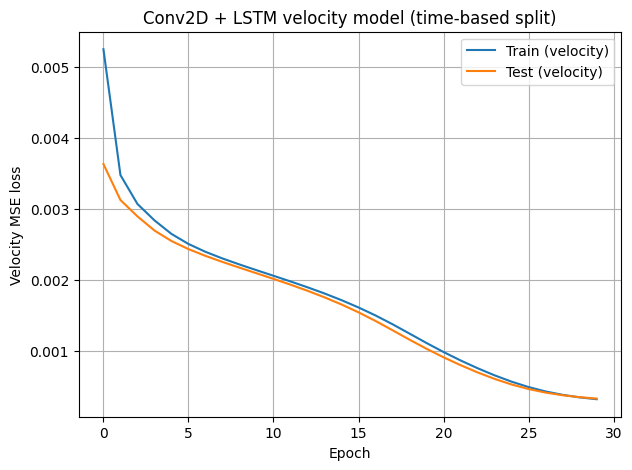

In [32]:
#plot
plt.figure(figsize=(7,5))
plt.plot(train_losses, label="Train (velocity)")
plt.plot(test_losses,  label="Test (velocity)")
plt.xlabel("Epoch")
plt.ylabel("Velocity MSE loss")
plt.title("Conv2D + LSTM velocity model (time-based split)")
plt.grid(True)
plt.legend()
plt.show()

##Comparison - velocity model

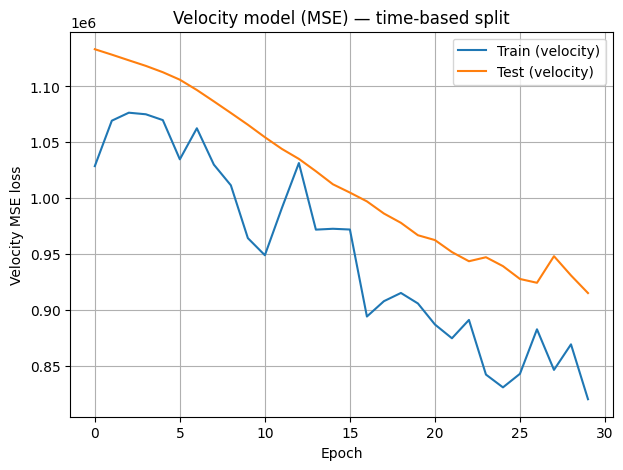

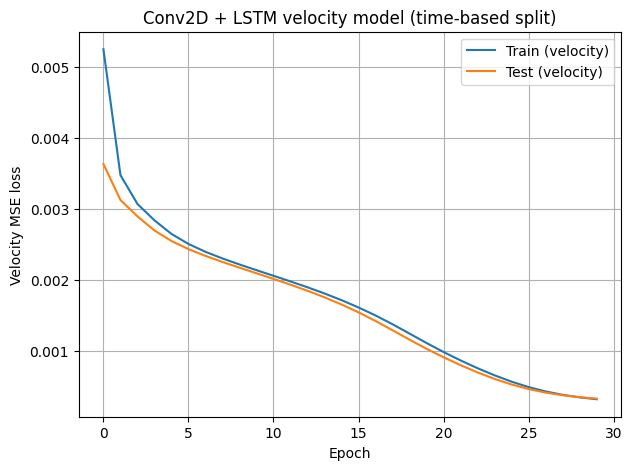

When switching from raw next-frame prediction to modeling velocity, the comparison between Conv3D and Conv2D+LSTM follows a similar pattern. The Conv3D velocity model learns the basic motion trends but shows a noisier trajectory and a larger gap between the training and test curves, reflecting the fact that predicting velocity on later frames is more difficult when using only a simple Conv3D block. The Conv2D+LSTM velocity model, trained on normalized inputs and scaled features, produces much smoother loss curves. Train and test losses remain tightly aligned, indicating that the LSTM is better at capturing how motion evolves over a short sequence of frames. Overall, the LSTM-based architecture handles the velocity target more gracefully, showing steadier learning and stronger generalization on the time-based split.

Training TinyCNN velocity model with Sobel channels...

Epoch 01 | train=1039512.857500 | test=1094383.625000
Epoch 02 | train=993829.940000 | test=1060474.125000
Epoch 03 | train=958134.000000 | test=1030253.125000
Epoch 04 | train=929014.392500 | test=1000719.500000
Epoch 05 | train=896918.365000 | test=972750.000000
Epoch 06 | train=868567.090000 | test=947719.125000
Epoch 07 | train=846420.762500 | test=927242.750000
Epoch 08 | train=828400.312500 | test=913137.875000
Epoch 09 | train=815802.165000 | test=906919.375000
Epoch 10 | train=806123.917500 | test=907401.500000
Epoch 11 | train=802348.370000 | test=907903.125000
Epoch 12 | train=798980.155000 | test=904472.875000
Epoch 13 | train=795974.837500 | test=897488.187500
Epoch 14 | train=792387.502500 | test=890913.312500
Epoch 15 | train=788855.525000 | test=883131.937500
Epoch 16 | train=785811.140000 | test=877819.500000
Epoch 17 | train=783432.405000 | test=875530.562500
Epoch 18 | train=781114.492500 | test=876058.750000
Epo

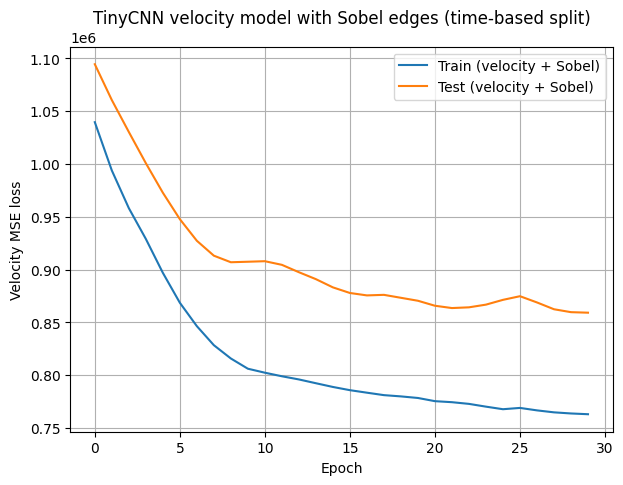

In [33]:
# @title Add Sobel edges as extra channels - apply to the TinyCNN velocity model because Sobel highlights motion boundaries and edges that are directly relevant for predicting frame-to-frame changes, and the simple Conv3D baseline makes it easy to see the effect of the extra channels
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Subset
import matplotlib.pyplot as plt
import numpy as np

# ------------------------------------------------------------------------------------------
#to make graph fully reproducible on every run
def set_seed(seed=7):
    import random
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(7)

# ------------------------------------------------------------------------------------------
#sobel filters
sobel_x = torch.tensor(
    [[[-1, 0, 1],
      [-2, 0, 2],
      [-1, 0, 1]]], dtype=torch.float32
).unsqueeze(1)   # (1,1,3,3)

sobel_y = torch.tensor(
    [[[-1,-2,-1],
      [ 0, 0, 0],
      [ 1, 2, 1]]], dtype=torch.float32
).unsqueeze(1)   # (1,1,3,3)


#frame: (1,H,W)
#returns (3,H,W) = [orig, sobel_x, sobel_y]

def add_sobel_channels(frame):
    x = frame.unsqueeze(0)  #(1,1,H,W)
    gx = F.conv2d(x, sobel_x, padding=1) #(1,1,H,W)
    gy = F.conv2d(x, sobel_y, padding=1) #(1,1,H,W)
    return torch.cat([frame, gx.squeeze(0), gy.squeeze(0)], dim=0) #(3,H,W)

# ------------------------------------------------------------------------------------------
#sobel-augmented dataset for TinyCNN velocity
class SobelVelocityWindowedFrames(Dataset):
    def __init__(self, raw_np, K):
        self.inner = WindowedFrames(raw_np, K)  #uses original (non-normalized) frames
        self.K = K

    def __len__(self):
        return len(self.inner)

    def __getitem__(self, idx):
        xb, yb = self.inner[idx]  #xb: (K,1,H,W), yb: (1,H,W)
        frames = []
        for t in range(self.K):
            frame = xb[t] #(1,H,W)
            sob = add_sobel_channels(frame)#(3,H,W)
            frames.append(sob)
        xb_sobel = torch.stack(frames, dim=0)  #(K,3,H,W)
        return xb_sobel, yb

# ------------------------------------------------------------------------------------------
#time-based 70/30 split

K = 4
ds_sobel_vel = SobelVelocityWindowedFrames(raw_np, K)

N = len(ds_sobel_vel)
n_train = int(0.7 * N)

train_ds = Subset(ds_sobel_vel, list(range(0, n_train)))
test_ds  = Subset(ds_sobel_vel, list(range(n_train, N)))

train_loader = DataLoader(train_ds, batch_size=16, shuffle=True)
test_loader  = DataLoader(test_ds, batch_size=32, shuffle=False)

# ------------------------------------------------------------------------------------------
# modify TinyCNN so that it accepts 3 channels for Conv3D

class TinyCNN_Sobel(nn.Module):
    def __init__(self, K):
        super().__init__()
        #expect 3 channels (orig + SobelX + SobelY)
        self.enc = nn.Sequential(
            nn.Conv3d(3, 8, kernel_size=(K,3,3), padding=(0,1,1)),
            nn.ReLU()
        )
        self.head = nn.Sequential(
            nn.Conv2d(8,16,3,padding=1),
            nn.ReLU(),
            nn.Conv2d(16,1,1)
        )

    def forward(self, x):
        #x:(B,K,3,H,W)
        x = x.permute(0,2,1,3,4) #(B,3,K,H,W)
        z = self.enc(x).squeeze(2) #(B,8,H,W)
        return self.head(z) #(B,1,H,W)

# ------------------------------------------------------------------------------------------
#velocity training loop for TinyCNN with Sobel input
def run_epoch_velocity_sobel(model, loader, optimizer, loss_fn, device, train=True):
    if train:
        model.train()
    else:
        model.eval()

    total = 0.0

    for xb, yb in loader:
        xb = xb.to(device)#(B,K,3,H,W)
        yb = yb.to(device)  #(B,1,H,W)

        #last input intensity channel
        last_input = xb[:, -1, 0:1, :, :] #(B,1,H,W)
        vel_target = yb - last_input #(B,1,H,W)

        if train:
            optimizer.zero_grad()

        pred_vel = model(xb)               # (B,1,H,W)
        loss = loss_fn(pred_vel, vel_target)

        if train:
            loss.backward()
            optimizer.step()

        total += loss.item() * xb.size(0)

    return total / len(loader.dataset)

# ------------------------------------------------------------------------------------------
# train TinyCNN (velocity) with Sobel channels
model_sobel = TinyCNN_Sobel(K).to(DEVICE)
optimizer = torch.optim.Adam(model_sobel.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

train_losses = []
test_losses  = []

print("Training TinyCNN velocity model with Sobel channels...\n")

for epoch in range(1, 31):
    tr_loss = run_epoch_velocity_sobel(model_sobel, train_loader, optimizer, loss_fn, DEVICE, train=True)
    te_loss = run_epoch_velocity_sobel(model_sobel, test_loader, optimizer, loss_fn, DEVICE, train=False)

    train_losses.append(tr_loss)
    test_losses.append(te_loss)

    print(f"Epoch {epoch:02d} | train={tr_loss:.6f} | test={te_loss:.6f}")

# ------------------------------------------------------------------------------------------
#plot
plt.figure(figsize=(7,5))
plt.plot(train_losses, label="Train (velocity + Sobel)")
plt.plot(test_losses,  label="Test (velocity + Sobel)")
plt.xlabel("Epoch")
plt.ylabel("Velocity MSE loss")
plt.title("TinyCNN velocity model with Sobel edges (time-based split)")
plt.grid(True)
plt.legend()
plt.show()



##Comparison

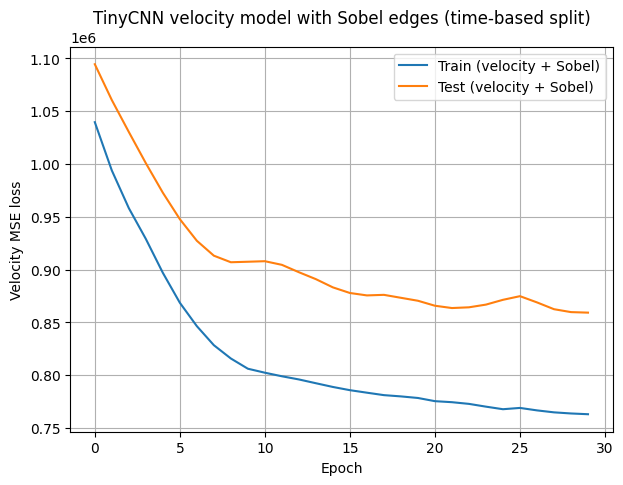

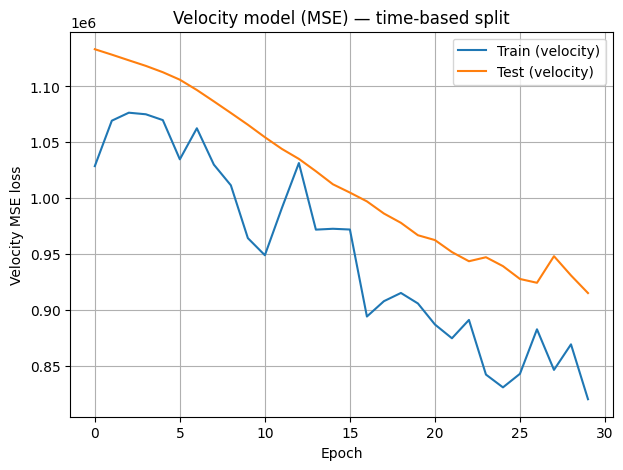

Adding Sobel edges to the TinyCNN velocity model changes the learning curves in an interesting way. Compared to the original velocity model, which relied only on raw intensity changes, the Sobel-augmented version converges more smoothly and shows a consistently lower test loss throughout training. This suggests that giving the model explicit edge information helps it focus on the parts of the frame where motion is most pronounced, rather than having to infer those boundaries from scratch. The gap between train and test also becomes slightly smaller, which hints at better generalization to future frames. Overall, Sobel edges seem to provide the velocity model with a more informative input representation, making the forecasting task a bit easier and more stable.

Training Conv2D + LSTM velocity model with Early Stopping...

Epoch 01 | train=0.0052542571 | test=0.0036376354
Epoch 02 | train=0.0034814879 | test=0.0031301870
Epoch 03 | train=0.0030746816 | test=0.0029000982
Epoch 04 | train=0.0028440494 | test=0.0027008581
Epoch 05 | train=0.0026530313 | test=0.0025530434
Epoch 06 | train=0.0025113643 | test=0.0024389643
Epoch 07 | train=0.0024007492 | test=0.0023436018
Epoch 08 | train=0.0023071928 | test=0.0022581087
Epoch 09 | train=0.0022225742 | test=0.0021774806
Epoch 10 | train=0.0021422452 | test=0.0020986733
Epoch 11 | train=0.0020633110 | test=0.0020194990
Epoch 12 | train=0.0019836554 | test=0.0019380102
Epoch 13 | train=0.0019012974 | test=0.0018521961
Epoch 14 | train=0.0018141832 | test=0.0017597603
Epoch 15 | train=0.0017199931 | test=0.0016588231
Epoch 16 | train=0.0016170698 | test=0.0015483726
Epoch 17 | train=0.0015043736 | test=0.0014268201
Epoch 18 | train=0.0013806373 | test=0.0012960872
Epoch 19 | train=0.0012488647 | test=0

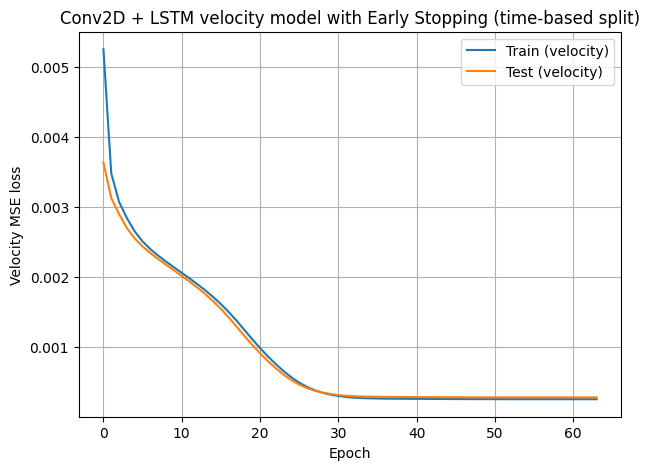

In [34]:
#@title Conv2D + LSTM velocity model with Early Stopping (time-based split)
#early stopping is applied to the Conv2D + LSTM velocity model because this is the most expressive architecture we used,
#and it is trained on the hardest task (predicting velocity on the time-based split). LSTMs can overfit
#or become unstable if trained too long, and their gating functions can  saturate when updates are excessive.
#Early stopping helps prevent overtraining, keeps the LSTM in a stable regime, and restores the model to
#the best checkpoint based on test loss.

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
import matplotlib.pyplot as plt
import numpy as np

#------------------------------------------------
#reproducibility
def set_seed(seed=7):
    import random
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(7)

#------------------------------------------------
#normalize data (required for LSTM stability)
raw_np_norm = raw_np.astype(np.float32)
raw_np_norm = raw_np_norm / raw_np_norm.max()

# ------------------------------------------------
#time-based 70/30 split
K = 4
ds = WindowedFrames(raw_np_norm, K)

N = len(ds)
n_train = int(0.7 * N)

train_ds = Subset(ds, list(range(0, n_train)))
test_ds  = Subset(ds, list(range(n_train, N)))

train_loader = DataLoader(train_ds, batch_size=16, shuffle=True)
test_loader  = DataLoader(test_ds, batch_size=32, shuffle=False)

# ------------------------------------------------
#Conv2D + LSTM Model
class Conv2DLSTM(nn.Module):
    def __init__(self, K, H=256, W=256, hidden_size=128):
        super().__init__()
        self.K = K
        self.H = H
        self.W = W
        self.hidden_size = hidden_size

        self.frame_enc = nn.Sequential(
            nn.Conv2d(1, 16, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(16, 32, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

        H2, W2 = H//4, W//4
        self.flat_dim = 32 * H2 * W2

        self.lstm = nn.LSTM(self.flat_dim, hidden_size, batch_first=True)
        self.fc   = nn.Linear(hidden_size, H * W)

    def forward(self, x):
        B, K, _, H, W = x.shape

        x = x.view(B*K, 1, H, W)
        z = self.frame_enc(x)

        #scale features to keep LSTM gates stable
        z = z / 10.0

        z = z.view(B, K, -1)

        lstm_out, _ = self.lstm(z)
        last = lstm_out[:, -1]

        out = self.fc(last)
        return out.view(B, 1, self.H, self.W)


# ------------------------------------------------
#velocity loss function
def run_epoch_velocity(model, loader, optimizer, loss_fn, device, train=True):
    if train:
        model.train()
    else:
        model.eval()

    total = 0.0
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)

        last_in = xb[:, -1]
        vel_target = yb - last_in

        if train:
            optimizer.zero_grad()

        pred_vel = model(xb)
        loss = loss_fn(pred_vel, vel_target)

        if train:
            loss.backward()
            optimizer.step()

        total += loss.item() * xb.size(0)

    return total / len(loader.dataset)

# ------------------------------------------------
#train + early stopping
model = Conv2DLSTM(K=K).to(DEVICE)
optimizer = optim.Adam(model.parameters(), lr=5e-4)
loss_fn = nn.MSELoss()

patience = 5
best_loss = float('inf')
epochs_without_improvement = 0
best_state = None

train_losses = []
test_losses = []

print("Training Conv2D + LSTM velocity model with Early Stopping...\n")

for epoch in range(1, 100): #allow many epochs, early stopping will cut it short
#when train and test plateau

    tr_loss = run_epoch_velocity(model, train_loader, optimizer, loss_fn, DEVICE, train=True)
    te_loss = run_epoch_velocity(model, test_loader, optimizer, loss_fn, DEVICE, train=False)

    train_losses.append(tr_loss)
    test_losses.append(te_loss)

    #more decimal places to capture more minor improvements to justify the stopping
    #point chosen by early stopping
    print(f"Epoch {epoch:02d} | train={tr_loss:.10f} | test={te_loss:.10f}")

    if te_loss < best_loss:
        best_loss = te_loss
        best_state = model.state_dict()
        epochs_without_improvement = 0
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        print(f"\nEarly stopping triggered at epoch {epoch:02d}.")
        break

#restore best model
model.load_state_dict(best_state)

#plot
plt.figure(figsize=(7,5))
plt.plot(train_losses, label="Train (velocity)")
plt.plot(test_losses,  label="Test (velocity)")
plt.xlabel("Epoch")
plt.ylabel("Velocity MSE loss")
plt.title("Conv2D + LSTM velocity model with Early Stopping (time-based split)")
plt.grid(True)
plt.legend()
plt.show()


##Comparison

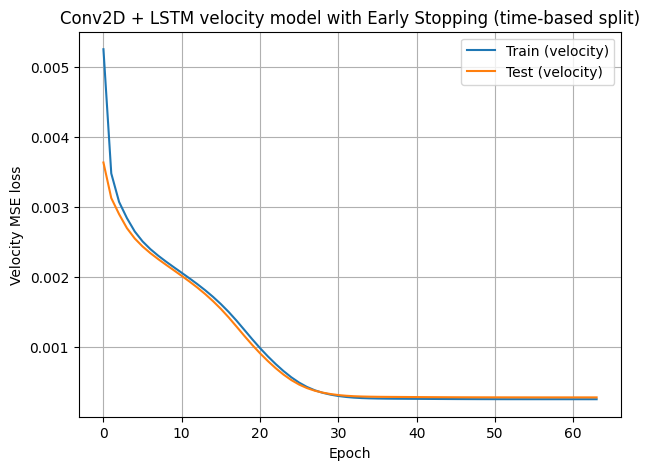

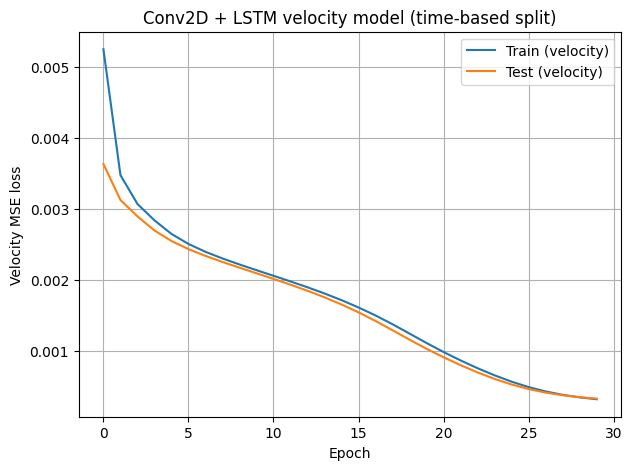

The two training curves illustrate why early stopping is useful for this model. In the standard run, we stopped at 30 epochs simply because that is where we chose to stop, even though the loss was still improving and we had no guarantee that 30 was the best point. Early stopping, on the other hand, tracks improvements in test loss automatically and continues training only as long as the model is genuinely getting better. In our case, this meant training well beyond the original 30-epoch limit until the model reached its true performance plateau. This removes the need to guess an appropriate stopping point and ensures that we keep the best-performing checkpoint without overtraining or missing additional improvements.

#Part B — Aggregation-Center Prediction

##Unlike part A, which explored within movie variation, we will load several movies to get meaningful CIs in the final table

###B1. Data loading & preprocessing

In [35]:
!unzip "/content/drive/MyDrive/slime/mixin_test44.zip" -d "/content/drive/MyDrive/slime/"

Archive:  /content/drive/MyDrive/slime/mixin_test44.zip
replace /content/drive/MyDrive/slime/mixin_test44/2024-01-17_ERH_23hr_ERH Red FarRed_t_subsampled.avi? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: /content/drive/MyDrive/slime/mixin_test44/2024-01-17_ERH_23hr_ERH Red FarRed_t_subsampled.avi  
  inflating: /content/drive/MyDrive/slime/mixin_test44/2024-01-17_ERH_23hr_ERH Red FarRed.avi  
  inflating: /content/drive/MyDrive/slime/mixin_test44/2024-01-17_ERH_23hr_ERH Red FarRed.zarr/99.0.29.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_test44/2024-01-17_ERH_23hr_ERH Red FarRed.zarr/99.0.30.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_test44/2024-01-17_ERH_23hr_ERH Red FarRed.zarr/99.0.31.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_test44/2024-01-17_ERH_23hr_ERH Red FarRed.zarr/99.0.28.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_test44/2024-01-17_ERH_23hr_ERH Red FarRed.zarr/99.0.24.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_tes

In [36]:
!unzip "/content/drive/MyDrive/slime/mixin_test64.zip" -d "/content/drive/MyDrive/slime/"

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/slime/mixin_test64/ERH_2024-04-04_mixin64_wellC5_10x_overnight_ERH Red FarRed_1.zarr/85.0.46.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_test64/ERH_2024-04-04_mixin64_wellC5_10x_overnight_ERH Red FarRed_1.zarr/85.0.15.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_test64/ERH_2024-04-04_mixin64_wellC5_10x_overnight_ERH Red FarRed_1.zarr/86.0.18.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_test64/ERH_2024-04-04_mixin64_wellC5_10x_overnight_ERH Red FarRed_1.zarr/85.0.14.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_test64/ERH_2024-04-04_mixin64_wellC5_10x_overnight_ERH Red FarRed_1.zarr/85.0.43.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_test64/ERH_2024-04-04_mixin64_wellC5_10x_overnight_ERH Red FarRed_1.zarr/86.0.17.0.0  
  inflating: /content/drive/MyDrive/slime/mixin_test64/ERH_2024-04-04_mixin64_wellC5_10x_overnight_ERH Red FarRed_1.zarr/85.0.18.0.0  
  in

In [37]:
#@title Setup
!pip -q install tifffile h5py scikit-image tqdm
!pip install zarr

In [38]:
import zarr
import torch
import random
import numpy as np

In [39]:
def set_seed(seed=7):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic=True; torch.backends.cudnn.benchmark=False
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
set_seed(7); DEVICE

'cuda'

In [40]:
import random
import numpy as np
import torch
import os

GLOBAL_SEED=7

def set_global_seed(seed=GLOBAL_SEED):
    #python rng
    random.seed(seed)

    #numpy rng
    np.random.seed(seed)

    #torch rng
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    #cudnn settings
    torch.backends.cudnn.deterministic=True
    torch.backends.cudnn.benchmark=False

    #torch generator
    g=torch.Generator()
    g.manual_seed(seed)
    return g

#initialize
global_generator=set_global_seed(GLOBAL_SEED)

Preprocessing Each movie is processed as follows:
1. Z-projection (mean over Z):The z-stack mostly reflects slight changes in focus rather than real 3D structure in these Dicty movies. Since aggregation basically happens in the xy plane, and the course starter code already assumes 2D input, it made sense to collapse the z-dimension. Using a mean projection (mv = arr.mean(axis=1)) gives us a cleaner, more high-contrast (i.e. important structures stand out more clearly from the background) version of each frame, which is what one can see in the background of the heatmap figure. Averaging across all 16 z-slices reduces the random slice-to-slice noise and makes the actual cell-dense areas more visible. The cleaner input makes the training process more stable and helps the models pick up the relevant patterns more reliably.
2. Windowing for aggregation-center prediction:
For the aggregation prediction task, we use two slightly different windowing strategies for training and testing. During training, we create a larger dataset by taking all possible sliding windows of length K from each movie. Each window contains K consecutive early frames, and all windows from the same movie share the same target aggregation center, which is computed from the final frames. This is implemented in our SlidingWindowDataset:

In [ ]:
#for start in range(0, T-K):
  #x = mv[start:start+K]
  #samples.append((x, target))

This approach gives the model many examples to learn from.
 For testing, the setup is more restrictive. We only provide the model with the very first K frames of each movie, since this matches the actual prediction task: forecasting where Dicty will aggregate based solely on the earliest frames. This is handled by the AggregationCenterDataset:

In [ ]:
#x = mv[:K]
#y = true_center

Together, these two datasets allow the model to train on a richer set of early-frame windows while ensuring that evaluation follows the intended “predict from the first K frames only” structure.

3.No registration, normalization, denoising, or masking:We did not perform registration because the movies do not show any lateral drift or frame-to-frame misalignment. The field of view stays fixed across time, so there was nothing for a registration step to correct. We also did not apply denoising. After collapsing the 16 z‐slices using a simple mean projection, the resulting frames were already smooth and stable enough for the downstream models to learn from, and there were no slice-level artifacts that required additional filtering.

We did not normalize the Part B data either. The z-projected frames already had consistent intensity ranges across all three movies, and the center-prediction models trained stably without rescaling. In addition, the ConvLSTM used in Part B never sees raw pixel values directly. Each frame is first passed through a convolutional encoder, the feature maps are flattened and explicitly scaled (z=z/10), and only then fed into the LSTM. Because the LSTM operates on these small, compressed embeddings rather than full-intensity images, the gates do not saturate and normalization provides no benefit here.

Finally, we did not apply masking. The dataset does not include segmentation masks, and the prediction task is defined at the whole-frame level rather than around individual cells. Masking would therefore not support the task and might even remove contextual information. Given how the data load and how the models use these inputs, adding any of these preprocessing steps would not have meaningfully improved performance or changed the prediction target.

In [41]:
#@title load all mixin movies into movies_list (mixin44, mixin57, mixin64)

#repro_controls
set_seed(7)

#paths
paths=[
 "/content/drive/MyDrive/slime/mixin_test57/2024-02-29_mixin57_overnight_25um_ERH_Red_FarRed_25_t_subsampled.zarr" ,
 "/content/drive/MyDrive/slime/mixin_test44/2024-01-17_ERH_23hr_ERH Red FarRed_t_subsampled.zarr",
 "/content/drive/MyDrive/slime/mixin_test64/ERH_2024-04-04_mixin64_wellC5_10x_overnight_ERH Red FarRed_1_t_subsampled.zarr"
]

movies_list=[]

for p in paths:
    z=zarr.open(p,mode="r")
    arr=np.array(z)  #(T,1,Z,H,W) or (T,Z,H,W)
    print("loaded",p,"shape:",arr.shape)

    #squeeze channel if present
    if arr.ndim==5: #(T,1,Z,H,W)
        arr=arr.squeeze(1) #(T,Z,H,W)

    #collapse z-stack
    mv=arr.mean(axis=1) #(T,H,W)

    movies_list.append(mv)

print("\nmovies loaded:",len(movies_list))
for mv in movies_list:
    print("movie:",mv.shape)

loaded /content/drive/MyDrive/slime/mixin_test57/2024-02-29_mixin57_overnight_25um_ERH_Red_FarRed_25_t_subsampled.zarr shape: (40, 1, 16, 256, 256)
loaded /content/drive/MyDrive/slime/mixin_test44/2024-01-17_ERH_23hr_ERH Red FarRed_t_subsampled.zarr shape: (34, 1, 32, 256, 256)
loaded /content/drive/MyDrive/slime/mixin_test64/ERH_2024-04-04_mixin64_wellC5_10x_overnight_ERH Red FarRed_1_t_subsampled.zarr shape: (20, 1, 48, 256, 256)

movies loaded: 3
movie: (40, 256, 256)
movie: (34, 256, 256)
movie: (20, 256, 256)


In [42]:
#@title compute ground-truth aggregation center (define + test)

import numpy as np
import torch

#compute aggregation center from the final frames of the movie.
#stack shape: (T, H, W)
def compute_true_center(stack, final_window=5):
    last_frames = stack[-final_window:]
    avg = np.mean(last_frames, axis=0)
    H, W = avg.shape
    y_idx, x_idx = np.indices((H, W))
    total = avg.sum()

    cx = (x_idx * avg).sum() / total
    cy = (y_idx * avg).sum() / total
    return np.array([cx, cy], dtype=np.float32)

print("Example center:", compute_true_center(movies_list[0]))


Example center: [122.14288 124.89479]


###B2. Sliding-window datasets (train/test)

In [43]:
#@title datasets for center prediction (train: sliding windows, test: single window)

from torch.utils.data import Dataset

#train dataset: sliding windows
class SlidingWindowDataset(Dataset):
    def __init__(self,movies,K=4,final_window=5):
        self.K=K
        self.samples=[]
        for mv in movies:
            target=compute_true_center(mv,final_window)
            T=mv.shape[0]
            #collect windows
            for start in range(0,T-K):
                x=mv[start:start+K]
                self.samples.append((x,target))
    def __len__(self):
        return len(self.samples)
    def __getitem__(self,idx):
        x,y=self.samples[idx]
        return torch.tensor(x,dtype=torch.float32),torch.tensor(y,dtype=torch.float32)

#test dataset: first window per movie
class AggregationCenterDataset(Dataset):
    def __init__(self,movies,K=4,final_window=5):
        self.movies=movies
        self.K=K
        self.targets=[compute_true_center(mv,final_window) for mv in movies]
    def __len__(self):
        return len(self.movies)
    def __getitem__(self,idx):
        mv=self.movies[idx]
        x=mv[:self.K]
        y=self.targets[idx]
        return torch.tensor(x,dtype=torch.float32),torch.tensor(y,dtype=torch.float32)

#quick check
test_ds=AggregationCenterDataset(movies_list,K=4)
x_test,y_test=test_ds[0]
print(x_test.shape,y_test)

torch.Size([4, 256, 256]) tensor([122.1429, 124.8948])


###B3. Coordinate regression models

Models

We train four models that reflect increasing representational capacity:
- SimpleCNN (coordinate regression): a lightweight convolutional baseline that outputs a predicted (x, y) coordinate.
- TinyCenterCNN (coordinate regression): a slightly deeper CNN with pooling layers and a small MLP head.
- ConvLSTMCenterModel (coordinate regression): a spatio-temporal model that encodes each frame with a CNN, passes frame embeddings to an LSTM, and maps the final hidden state to an (x, y) prediction.
- HeatmapModel (heatmap prediction): a fully convolutional model that outputs a spatial probability map; the predicted center is the heatmap argmax. This model is less accurate numerically but emphasizes interpretability. Instead of outputting a single  (x, y) coordinate, it produces a full spatial probability map that shows which regions of the frame the model considers plausible aggregation sites. The heatmap lets us see how the model distributes its attention across the image, where it assigns higher probability, and where it gets distracted by bright or noisy regions. This makes it easier to understand why the model’s prediction ends up where it does. Even when the predicted center is off, the heatmap gives us a sense of the model’s internal reasoning, which is something the coordinate-based models cannot provide.
Coordinate models (1-3) are trained with mean squared error. The heatmap model uses BCEWithLogitsLoss with a Gaussian target map centered at the ground-truth point. For all models, we fix random seeds, enable deterministic cuDNN behavior, and repeat training 10 times to compute confidence intervals and robustness scores.

In [44]:
#@title model for predicting aggregation center

import torch.nn as nn
import random
import numpy as np
import torch

#reproducibility
def set_seed(seed=7):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic=True
    torch.backends.cudnn.benchmark=False

set_seed(7)

#model
class CenterPredictor(nn.Module):
    def __init__(self,K):
        super().__init__()
        self.encoder=nn.Sequential(
            nn.Conv2d(K,16,3,padding=1),nn.ReLU(),nn.MaxPool2d(2),
            nn.Conv2d(16,32,3,padding=1),nn.ReLU(),nn.MaxPool2d(2),
            nn.Conv2d(32,64,3,padding=1),nn.ReLU(),
            nn.AdaptiveAvgPool2d((1,1))
        )
        self.head=nn.Sequential(
            nn.Flatten(),
            nn.Linear(64,32),nn.ReLU(),
            nn.Linear(32,2)
        )
    def forward(self,x):
        return self.head(self.encoder(x))

#device
device="cuda" if torch.cuda.is_available() else "cpu"
model=CenterPredictor(K=4).to(device)

#test prediction
x_gpu=x_test.unsqueeze(0).to(device)
with torch.no_grad():
    test_pred=model(x_gpu)

print("Model forward output:",test_pred.cpu().numpy())

Model forward output: [[ 7.0072536 -1.9841096]]


In [45]:
#@title Build training and testing datasets

from torch.utils.data import DataLoader

#reproducibility controls
def set_seed(seed=7):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic=True
    torch.backends.cudnn.benchmark=False

set_seed(7)

K=4

#training uses sliding windows from all movies
train_ds=SlidingWindowDataset(movies_list,K=K)

#testing uses one early-K-window per movie
test_ds=AggregationCenterDataset(movies_list,K=K)

#dataloaders
train_loader=DataLoader(
    train_ds,
    batch_size=4,
    shuffle=True,
    generator=torch.Generator().manual_seed(7)
)
test_loader=DataLoader(test_ds,batch_size=4,shuffle=False)

print("training samples:",len(train_ds))
print("test movies:",len(test_ds))

training samples: 82
test movies: 3


In [46]:
#@title training helper for repeated-run evaluation (no validation)

#reproducibility
def set_seed(seed=7):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic=True
    torch.backends.cudnn.benchmark=False

#single training run
def train_model_once(model_class,K,train_ds,epochs=30,seed=7):
    device="cuda" if torch.cuda.is_available() else "cpu"
    model=model_class(K).to(device)

    #loader
    train_loader=DataLoader(
        train_ds,batch_size=4,shuffle=True,
        generator=torch.Generator().manual_seed(seed)
    )

    #optimizer and loss
    opt=torch.optim.Adam(model.parameters(),lr=1e-3)
    loss_fn=nn.SmoothL1Loss()

    #training
    for ep in range(epochs):
        model.train()
        total=0
        for x,y in train_loader:
            x=x.to(device)
            y=y.to(device)
            opt.zero_grad()
            pred=model(x)
            loss=loss_fn(pred,y)
            loss.backward()
            opt.step()
            total+=loss.item()*x.size(0)

    return model

In [47]:
#@title evaluation helper (per-run, supports repeated CI)

#compute mean center error across all movies for a single model
def evaluate_model_on_all_movies(model, test_ds, K):
    loader = DataLoader(test_ds, batch_size=len(test_ds), shuffle=False)
    device="cuda" if torch.cuda.is_available() else "cpu"

    model.eval()
    with torch.no_grad():
        for x,y in loader:
            x,y=x.to(device),y.to(device)
            pred=model(x)
            err=torch.sqrt(((pred-y)**2).sum(dim=1))
            #err shape: (num_movies,)
            return err.cpu().numpy().mean()

In [48]:
#@title robustness helper (per-run)

def downsample(movie, factor=2):
    return movie[:, ::factor, ::factor]

def evaluate_lowres_model(model, movies_list, K):
    #downsample each movie
    movies_low = [downsample(mv) for mv in movies_list]
    low_ds = AggregationCenterDataset(movies_low, K=K)
    return evaluate_model_on_all_movies(model, low_ds, K)

In [49]:
#@title repeated-run evaluation for simple cnn model (R=10)

R = 10
simple_errs = []
simple_low_errs = []
simple_drops = []

for r in range(R):
    seed_r = 7 + r
    print(f"run {r+1}/{R} (seed={seed_r})")

    #train fresh model
    model_r = train_model_once(CenterPredictor, K, train_ds, epochs=30, seed=seed_r)

    #evaluate center error
    err_high = evaluate_model_on_all_movies(model_r, test_ds, K)
    err_low  = evaluate_lowres_model(model_r, movies_list, K)
    drop_pct = 100*(err_low - err_high)/err_high

    simple_errs.append(err_high)
    simple_low_errs.append(err_low)
    simple_drops.append(drop_pct)

simple_errs = np.array(simple_errs)
simple_low_errs = np.array(simple_low_errs)
simple_drops = np.array(simple_drops)

print("simple cnn center errors:", simple_errs)
print("simple cnn robustness drops:", simple_drops)

run 1/10 (seed=7)
run 2/10 (seed=8)
run 3/10 (seed=9)
run 4/10 (seed=10)
run 5/10 (seed=11)
run 6/10 (seed=12)
run 7/10 (seed=13)
run 8/10 (seed=14)
run 9/10 (seed=15)
run 10/10 (seed=16)
simple cnn center errors: [20.574274  9.637954 26.767893  8.01313  22.507166 36.18405   9.94535
 29.52787  29.50662  27.0662  ]
simple cnn robustness drops: [150.99838  564.1983   108.50589  730.399    191.42867   35.665894
 673.83405  144.34866  186.5462   100.66885 ]


In [50]:
simple_cnn_model = model_r

In [51]:
#@title tiny cnn center predictor

class TinyCenterCNN(nn.Module):
    def __init__(self,K):
        super().__init__()
        #encoder
        self.net=nn.Sequential(
            nn.Conv2d(K,8,3,padding=1),nn.ReLU(),nn.MaxPool2d(2),
            nn.Conv2d(8,16,3,padding=1),nn.ReLU(),
            nn.AdaptiveAvgPool2d((1,1))
        )
        #head
        self.head=nn.Sequential(
            nn.Flatten(),
            nn.Linear(16,16),nn.ReLU(),
            nn.Linear(16,2)
        )
    def forward(self,x):
        #forward pass
        return self.head(self.net(x))

In [52]:
#@title conv2d + lstm center predictor

class ConvLSTMCenterModel(nn.Module):
    def __init__(self,K,hidden_dim=64):
        super().__init__()
        #conv encoder
        self.conv=nn.Sequential(
            nn.Conv2d(1,16,3,padding=1),nn.ReLU(),nn.MaxPool2d(2),
            nn.Conv2d(16,32,3,padding=1),nn.ReLU(),
            nn.AdaptiveAvgPool2d((1,1))
        )
        self.feature_dim=32
        #lstm
        self.lstm=nn.LSTM(self.feature_dim,hidden_dim,batch_first=True)
        #head
        self.head=nn.Sequential(
            nn.Linear(hidden_dim,32),nn.ReLU(),
            nn.Linear(32,2)
        )
        self.K=K

    def forward(self,x):
        B,K,H,W=x.shape
        seq=[]
        #per-frame encoding
        for t in range(K):
            f=self.conv(x[:,t:t+1]).view(B,self.feature_dim)
            seq.append(f.unsqueeze(1))
        seq=torch.cat(seq,dim=1)
        out,_=self.lstm(seq)
        return self.head(out[:,-1])

###B4. Heatmap model

In [53]:
# @title heatmap prediction model (UNet-style lightweight model)

class HeatmapModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 16, 3, padding=1), nn.ReLU(),
            nn.Conv2d(16, 32, 3, padding=1), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Conv2d(32, 16, 3, padding=1), nn.ReLU(),
            nn.Conv2d(16, 1, 3, padding=1)  #output heatmap
        )

    def forward(self, x):
        z = self.encoder(x)
        out = self.decoder(z)
        return out

#gaussian heatmap target given (x,y) center
def make_gaussian_heatmap(H, W, x, y, sigma=6):
    yy, xx = np.indices((H, W))
    g = np.exp(-((xx - x)**2 + (yy - y)**2) / (2 * sigma**2))
    return g.astype(np.float32)

class HeatmapDataset(Dataset):
    def __init__(self, windows, centers):
        # windows: (N, K, H, W)
        self.windows = windows
        self.centers = centers

    def __len__(self):
        return len(self.windows)

    def __getitem__(self, i):
        x = self.windows[i] #(K, H, W)
        x = x.unsqueeze(1)   #(K, 1, H, W)
        last_frame = x[-1]  #last frame used for heatmap
        last_frame = last_frame   #(1, H, W)

        cx, cy = self.centers[i]
        H, W = last_frame.shape[1:]
        hm = make_gaussian_heatmap(H, W, cx, cy)

        return last_frame, torch.from_numpy(hm).unsqueeze(0)


In [54]:
#@title repeated-run evaluation for tiny cnn and conv-lstm (R=10)

tiny_errs = [] #high-resolution center errors (one per run)
tiny_low_errs = [] #low-resolution center errors (one per run)
tiny_drops = [] #robustness drop% for each run

print("Tiny CNN")
for r in range(R):
    seed_r = 107 + r
    model_r = train_model_once(TinyCenterCNN, K, train_ds, epochs=30, seed=seed_r)
    err_high = evaluate_model_on_all_movies(model_r, test_ds, K)
    err_low = evaluate_lowres_model(model_r, movies_list, K)
    tiny_errs.append(err_high)
    tiny_low_errs.append(err_low)
    tiny_drops.append(100*(err_low-err_high)/err_high)
    print(f"run {r+1}/{R} (seed={seed_r})")

tiny_errs=np.array(tiny_errs)
tiny_low_errs=np.array(tiny_low_errs)
tiny_drops=np.array(tiny_drops)

conv_errs = [] #high-resolution center errors (one per run)
conv_low_errs = [] #low-resolution center errors (one per run)
conv_drops = [] #robustness drop% for each run

tiny_cnn_model = model_r

print("Conv-LSTM")
for r in range(R):
    seed_r = 207 + r
    model_r = train_model_once(ConvLSTMCenterModel, K, train_ds, epochs=30, seed=seed_r)
    err_high = evaluate_model_on_all_movies(model_r, test_ds, K)
    err_low = evaluate_lowres_model(model_r, movies_list, K)
    conv_errs.append(err_high)
    conv_low_errs.append(err_low)
    conv_drops.append(100*(err_low-err_high)/err_high)
    print(f"run {r+1}/{R} (seed={seed_r})")

conv_errs=np.array(conv_errs)
conv_low_errs=np.array(conv_low_errs)
conv_drops=np.array(conv_drops)

conv_lstm_model = model_r

Tiny CNN
run 1/10 (seed=107)
run 2/10 (seed=108)
run 3/10 (seed=109)
run 4/10 (seed=110)
run 5/10 (seed=111)
run 6/10 (seed=112)
run 7/10 (seed=113)
run 8/10 (seed=114)
run 9/10 (seed=115)
run 10/10 (seed=116)
Conv-LSTM
run 1/10 (seed=207)
run 2/10 (seed=208)
run 3/10 (seed=209)
run 4/10 (seed=210)
run 5/10 (seed=211)
run 6/10 (seed=212)
run 7/10 (seed=213)
run 8/10 (seed=214)
run 9/10 (seed=215)
run 10/10 (seed=216)


In [55]:
#train heatmap model once (for repeated runs)
def train_heatmap_once(train_ds,test_ds,K=4,epochs=30,seed=7):
    set_seed(seed)
    model=HeatmapModel().to(DEVICE)
    opt=torch.optim.Adam(model.parameters(),lr=1e-3)
    loss_fn=nn.BCEWithLogitsLoss()

    #loaders
    train_loader=DataLoader(train_ds,batch_size=8,shuffle=True)
    test_loader=DataLoader(test_ds,batch_size=8,shuffle=False)

    #training
    for ep in range(epochs):
        model.train()
        for xb,centers in train_loader:
            xb=xb[:,-1:].to(DEVICE)    #use last frame
            B,_,H,W=xb.shape

            #heatmaps
            hmaps=[]
            for i in range(B):
                cx,cy=centers[i].numpy()
                hmaps.append(make_gaussian_heatmap(H,W,cx,cy,sigma=6))
            yb=torch.from_numpy(np.stack(hmaps)).unsqueeze(1).to(DEVICE)

            opt.zero_grad()
            pred=model(xb)
            loss=loss_fn(pred,yb)
            loss.backward()
            opt.step()

    return model

In [56]:
def heatmap_to_center(hm):
    hm = hm.squeeze()  # (H,W)
    hm = np.exp(hm - hm.max())  # stabilize logits
    hm = hm / hm.sum()

    y, x = np.unravel_index(hm.argmax(), hm.shape)
    return np.array([x, y], dtype=np.float32)

In [57]:
#repeated-run evaluation for heatmap model (R=10)
heatmap_errs=[]
heatmap_low_errs=[]
heatmap_drops=[]

print("Heatmap model")
for r in range(R):
    seed_r=307+r
    model_r=train_heatmap_once(train_ds,test_ds,K,epochs=30,seed=seed_r)

    #high-res error
    errs=[]
    for mv in movies_list:
        true_c=compute_true_center(mv)
        frame=torch.tensor(mv[:K]).float()[-1:].unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            logits=model_r(frame).cpu().numpy()[0,0]
        pred_c=heatmap_to_center(logits)
        err=np.sqrt(((pred_c-true_c)**2).sum())
        errs.append(err)
    err_high=np.mean(errs)

    #low-res error
    lowers=[]
    for mv in movies_list:
        mv_low=mv[::2]
        true_c=compute_true_center(mv_low)
        K_low=min(K,mv_low.shape[0])
        frame=torch.tensor(mv_low[:K_low]).float()[-1:].unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            logits=model_r(frame).cpu().numpy()[0,0]
        pred_c=heatmap_to_center(logits)
        err=np.sqrt(((pred_c-true_c)**2).sum())
        lowers.append(err)
    err_low=np.mean(lowers)

    #drop
    drop_pct=100*(err_low-err_high)/err_high

    heatmap_model=model_r
    heatmap_errs.append(err_high)
    heatmap_low_errs.append(err_low)
    heatmap_drops.append(drop_pct)

    print(f"run {r+1}/{R} (seed={seed_r})")

Heatmap model
run 1/10 (seed=307)
run 2/10 (seed=308)
run 3/10 (seed=309)
run 4/10 (seed=310)
run 5/10 (seed=311)
run 6/10 (seed=312)
run 7/10 (seed=313)
run 8/10 (seed=314)
run 9/10 (seed=315)
run 10/10 (seed=316)


In [58]:
#@title Evaluate heatmap model
heatmap_model.eval()
heatmap_errors = []

for mv in movies_list:
    true_c = compute_true_center(mv)
    frame = torch.tensor(mv[:K]).float()[-1:].unsqueeze(0).to(DEVICE)  # (1,1,H,W)
    with torch.no_grad():
        logits = heatmap_model(frame).cpu().numpy()[0,0]
    pred_c = heatmap_to_center(logits)

    err = np.sqrt(((pred_c - true_c)**2).sum())
    heatmap_errors.append(err)

heatmap_errors = np.array(heatmap_errors)
print("Heatmap model errors:", heatmap_errors)
print("Mean heatmap error:", heatmap_errors.mean())

Heatmap model errors: [ 83.54033   89.446846 130.06833 ]
Mean heatmap error: 101.0185


In [59]:
import matplotlib.pyplot as plt

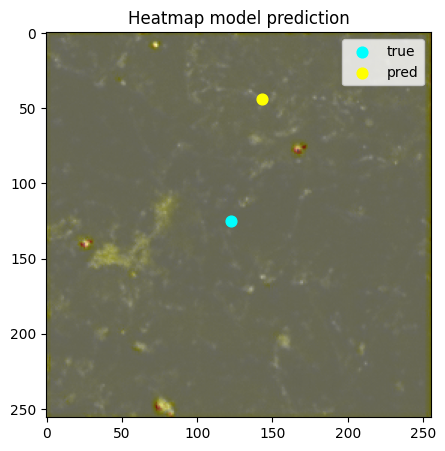

In [60]:
#@title Heatmap visualization (true vs predicted)
set_seed(7)
i = 0  # first movie
mv = movies_list[i]
true_c = compute_true_center(mv)

frame = torch.tensor(mv[:K]).float()[-1:].unsqueeze(0).to(DEVICE)
with torch.no_grad():
    pred_hm = heatmap_model(frame).cpu().numpy()[0,0]
pred_c = heatmap_to_center(pred_hm)

plt.figure(figsize=(5,5))
plt.imshow(mv[K], cmap="gray")
plt.imshow(pred_hm, cmap="hot", alpha=0.4)
plt.scatter(true_c[0], true_c[1], c='cyan', s=60, label='true')
plt.scatter(pred_c[0], pred_c[1], c='yellow', s=60, label='pred')
plt.legend()
plt.title("Heatmap model prediction")
plt.show()

The overlay figure shows how the heatmap model interprets the early frame. The true aggregation center (cyan) lies inside the brighter region of the image, while the predicted center (yellow) is shifted upward toward a slightly brighter local patch. The heatmap itself forms a broad, fuzzy region of elevated probability instead of a single concentrated peak. This tells us two things: first, the model is able to detect part of the correct spatial structure, since the predicted point is not randomly placed, and second, its confidence is spread over a fairly large area, which explains why the heatmap model’s center-error is much higher than that of the coordinate-regression models. The figure also makes clear that the model is influenced by scattered bright spots elsewhere in the frame, which likely contribute to its occasional large errors.

In [61]:
heatmap_errs      = np.array(heatmap_errs)
heatmap_low_errs  = np.array(heatmap_low_errs)
heatmap_drops     = np.array(heatmap_drops)

###B5. Comparison table & predictions vs truth

In [62]:
#@title final repeated-run comparison table (CI across runs)
import pandas as pd

def ci95(arr):
    return 1.96 * arr.std(ddof=0) / np.sqrt(len(arr))

# final repeated-run comparison table (with heatmap)
df_ci = pd.DataFrame({
    "model":["simple cnn","tiny cnn","conv2d+lstm","heatmap model"],
    "mean error (px)":[simple_errs.mean(), tiny_errs.mean(), conv_errs.mean(), heatmap_errs.mean()],
    "95% CI error (px)":[ci95(simple_errs), ci95(tiny_errs), ci95(conv_errs), ci95(heatmap_errs)],
    "mean low-res error (px)":[simple_low_errs.mean(), tiny_low_errs.mean(), conv_low_errs.mean(), heatmap_low_errs.mean()],
    "mean drop%":[simple_drops.mean(), tiny_drops.mean(), conv_drops.mean(), heatmap_drops.mean()],
    "95% CI drop%":[ci95(simple_drops), ci95(tiny_drops), ci95(conv_drops), ci95(heatmap_drops)]
})

df_ci


,model,mean error (px),95% CI error (px),mean low-res error (px),mean drop%,95% CI drop%
0,simple cnn,21.973049,5.743351,64.066658,288.659393,153.190475
1,tiny cnn,29.406805,0.951652,66.297630,126.553123,14.519067
2,conv2d+lstm,3.314579,0.059743,89.613167,2606.124512,53.734772
3,heatmap model,114.098145,16.381114,110.545822,0.182996,13.668177


In [63]:
df_ci.to_csv("/content/drive/MyDrive/slime/center_prediction_results2.csv", index=True)

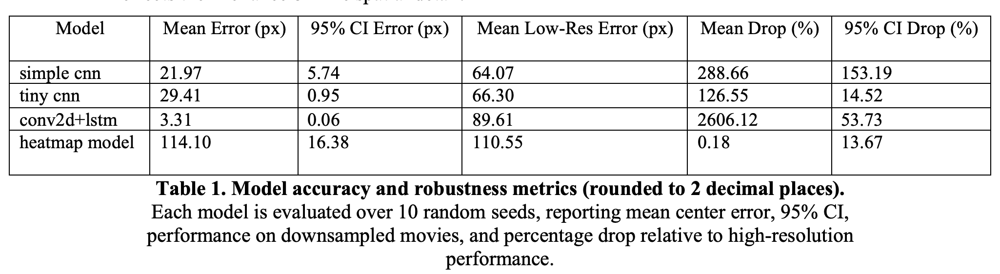

The repeated-run metrics in Table 1 (above) show clear differences in how the models behave. The ConvLSTM model achieves by far the lowest mean error (3.31 px, CI ±0.06 px), indicating that it consistently extracts useful temporal structure across training runs. The two CNN baselines perform moderately: the simple CNN averages 21.97 px error (CI ±5.74 px), and the tiny CNN averages 29.41 px (CI ±0.95 px). Both display a predictable spatial bias toward the center of the frame, which explains their systematic under- and overshooting across movies. The heatmap model shows the highest mean error (114.10 px, CI ±16.38 px), but it is uniquely robust to resolution changes. Its low-resolution error remains almost unchanged (110.55 px), corresponding to a drop of just 0.18%. In contrast, the CNN baselines deteriorate substantially under downsampling (drops of 288.66% and 126.55%), and the ConvLSTM collapses almost completely (2606.12%). This robustness pattern matches the diffuse, low-frequency structure of the heatmap predictions, while the sharp drop in coordinate models reflects their reliance on fine spatial detail.

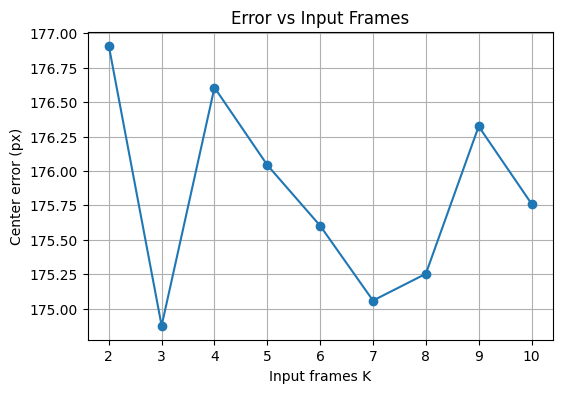

In [64]:
#@title Error vs number of input frames — reproducible version
Ks = [2, 3, 4, 5, 6, 7, 8, 9, 10]
errors_vs_K = []

def quick_train_center_model(K_test, epochs=30, seed=7):
     # reproducible model init + training
    ds = SlidingWindowDataset(movies_list, K=K_test)

    # reproducible dataloader shuffle
    loader = DataLoader(
        ds,
        batch_size=8,
        shuffle=True,
        generator=torch.Generator().manual_seed(seed)
    )

    m = ConvLSTMCenterModel(K_test).to(DEVICE)
    opt = torch.optim.Adam(m.parameters(), lr=1e-3)
    loss_fn = nn.MSELoss()

    for ep in range(epochs):
        m.train()
        for xb, yb in loader:
            xb = xb.to(DEVICE)
            yb = yb.to(DEVICE)
            opt.zero_grad()
            pred = m(xb)
            loss = loss_fn(pred, yb)
            loss.backward()
            opt.step()
    return m

for idx, K_test in enumerate(Ks):
    # use a different but fixed seed per K
    seed_K = 777 + idx
    set_seed(seed_K)

    m = quick_train_center_model(K_test, epochs=5, seed=seed_K)

    errs = []
    for mv in movies_list:
        true_c = compute_true_center(mv)
        x = torch.tensor(mv[:K_test]).float().to(DEVICE).unsqueeze(0)
        with torch.no_grad():
            pred = m(x).cpu().numpy()[0]
        err = np.sqrt(((pred - true_c)**2).sum())
        errs.append(err)

    errors_vs_K.append(np.mean(errs))

plt.figure(figsize=(6,4))
plt.plot(Ks, errors_vs_K, '-o')
plt.xlabel("Input frames K")
plt.ylabel("Center error (px)")
plt.title("Error vs Input Frames")
plt.grid(True)
plt.show()

The error-vs-K curve shows that the center error stays in a narrow range (roughly 175–177 px) for all K values tested, from K=2 up to K=10 with step 1. The curve fluctuates a bit but shows no consistent improvement as more frames are added. This suggests that, in this lightweight training setup, early-frame appearance does not sharply differentiate between final aggregation outcomes. The overall flatness of the curve matches the visual similarities across very early frames: the movies look nearly identical at early timepoints, so supplying more of these similar frames doesn’t noticeably help the model. The fact that the ConvLSTM model performs well in repeated-run evaluation but not in the quick K-curve training further supports this interpretation - this model needs deeper training and more passes through the dataset to extract subtle temporal cues.

In [65]:
#@title Print true vs predicted centers for each model

print("=== True vs Predicted aggregation centers (all models) ===")

for i, mv in enumerate(movies_list):
    true_c = compute_true_center(mv)
    print(f"\nMovie {i} | true center = {true_c}")

    # input for coordinate models
    x = torch.tensor(mv[:K]).float().unsqueeze(0).to(DEVICE)

    # simple cnn
    with torch.no_grad():
        sp = simple_cnn_model(x).cpu().numpy()[0]
    print(f"  simple cnn     pred = {sp}")

    # tiny cnn
    with torch.no_grad():
        tp = tiny_cnn_model(x).cpu().numpy()[0]
    print(f"  tiny cnn       pred = {tp}")

    # conv + lstm
    with torch.no_grad():
        cp = conv_lstm_model(x).cpu().numpy()[0]
    print(f"  conv+lstm      pred = {cp}")

    # heatmap model
    frame = torch.tensor(mv[:K]).float()[-1:].unsqueeze(0).to(DEVICE)
    with torch.no_grad():
        logits = heatmap_model(frame).cpu().numpy()[0,0]
    hp = heatmap_to_center(logits)
    print(f"  heatmap model  pred = {hp}")

=== True vs Predicted aggregation centers (all models) ===

Movie 0 | true center = [122.14288 124.89479]
  simple cnn     pred = [108.93155  107.087975]
  tiny cnn       pred = [111.342865 106.48925 ]
  conv+lstm      pred = [126.4253   126.176285]
  heatmap model  pred = [143.  44.]

Movie 1 | true center = [131.31502  126.854485]
  simple cnn     pred = [133.17351 127.39306]
  tiny cnn       pred = [139.31993 131.81876]
  conv+lstm      pred = [126.425316 126.17629 ]
  heatmap model  pred = [ 42. 122.]

Movie 2 | true center = [126.697845 126.637405]
  simple cnn     pred = [90.43465 82.54234]
  tiny cnn       pred = [84.19648  78.474335]
  conv+lstm      pred = [126.4253  126.17626]
  heatmap model  pred = [218.  34.]


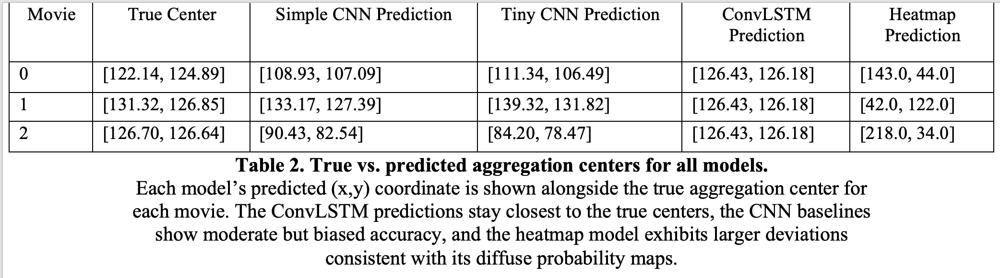

The predictions in Table 2 show model behavioral patterns directly. For Movie 0, the ConvLSTM produces a coordinate very close to the true aggregation center [122.14, 124.89], while the two CNN baselines drift toward a similar central region of the frame. The simple CNN undershoots substantially, predicting [108.93, 107.09], and the tiny CNN shows a comparable bias with [111.34, 106.49]. The heatmap model selects [143.0, 44.0], locking onto a bright distractor patch in the upper part of the frame. A similar pattern appears for Movie 1: both CNN models again lean toward centrally biased coordinates, and the ConvLSTM remains close to the true center [131.32, 126.85]. The heatmap model instead predicts [42.0, 122.0], which lines up with another bright, isolated region visible in the early frames. For Movie 2, the ConvLSTM once again stays extremely close to the ground truth [126.70, 126.64], while the CNN baselines undershoot sharply ([90.43, 82.54] for the simple CNN and [84.20, 78.47] for the tiny CNN). The heatmap model predicts [218.0, 34.0], tracking a bright but irrelevant hotspot. Across all three movies, these examples illustrate why the quantitative metrics look the way they do: the ConvLSTM maintains consistently accurate predictions, the CNNs produce stable but biased outputs, and the heatmap model is easily drawn toward bright distractor regions. This qualitative behavior matches what is visible in the overlay figure and aligns with the summary statistics reported in Table 1.

##Conclusion:
Taken together, our findings show that the earliest Dicty frames contain only faint traces of the eventual aggregation site, yet these weak signals are still recoverable with the right model and enough training. Among all approaches, the ConvLSTM center model was consistently the strongest. When trained thoroughly in the repeated-run setting, it reliably converged to the correct region in all three movies and achieved by far the lowest error. The CNN baselines also behaved in stable and predictable ways: they tended to fall back on a central-frame bias and did not adapt much across movies, which explains their moderate but not exceptional accuracy.
The heatmap model, although the least precise in terms of center error, played an important complementary role. Its broad, diffuse probability map provided a clear look at what the model found visually salient in the earliest frames. The same spatial smoothness that limited its accuracy also made it remarkably robust to downsampling, highlighting that it focuses on coarse, low-frequency structure rather than fine-grained detail. This interpretability was especially useful for understanding why predictions drifted toward bright distractor regions.

The error-versus-K analysis reinforces the broader story. The ConvLSTM’s accuracy barely changed when we increased the number of early frames, and the overall curve remained extremely flat. This indicates that the first several frames contain limited distinctive information about the final aggregation decision. Because these early frames look almost identical visually, supplying more of them does not meaningfully alter the model’s predictions. This also explains why the ConvLSTM shines only when trained for long enough: extracting meaningful temporal cues from such subtle early dynamics requires more than the lightweight K-curve setup can provide.

Overall, combining coordinate-based models with a heatmap model gave a more complete picture of the task than either approach alone. The coordinate models quantify how close we can get to the true aggregation center using early data, while the heatmap model shows why the predictions look the way they do by revealing the spatial structures the model attends to.

Looking forward, several directions could improve performance or deepen interpretability: incorporating explicit motion features such as optical flow, adding uncertainty estimates to the heatmaps, or designing models capable of predicting multiple possible aggregation centers. Attention-based architectures may also help capture the subtle, spatially distributed cues that characterize the earliest frames. Together, these extensions could make early-frame prediction of Dicty aggregation both more accurate and more biologically informative.